### Step 0: Get packages and helper functions

In [1]:
# Add source and data file paths
import os
path = os.path.abspath(os.getcwd())
os.chdir("../..")
parent_path = os.path.abspath(os.getcwd())

import sys 
sys.path.insert(1, parent_path + '\\source')
sys.path.insert(2, parent_path + '\\data')

import numpy as np; import torch; import time

# Import source/helper functions
from misc_helper import combine_layers, get_dt, get_userPar, training_loop, make_gif
from plot_helper import reference_plot, sample_plot
from trainingData_helper import generate_trainData
from windowSweep_helper import window_sweep_class
from pde_helper import PDE_class
from neuralNetwork_helper import Net, activation_func_a, weight_class, dtPINN

## Step 1: Define PDE problem and visualize 

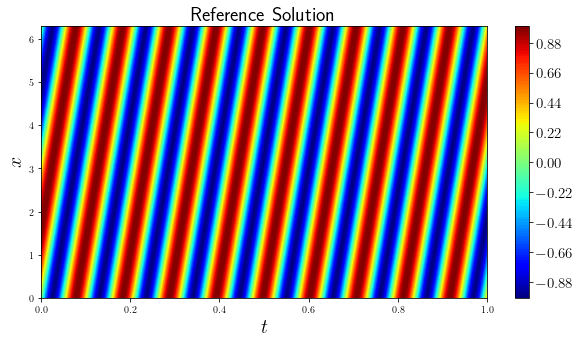

In [2]:
pde_type = 'new'
newParams = {}; newParams['data'] = parent_path+'\\data\\convec_highB.mat'; newParams['pde'] = 'u_t + 60*u_x'; newParams['IC'] = 'np.sin(x)';

PDE = PDE_class(pde_type, newParams)
dataPar = PDE.data()

# Reference solution
reference_plot(dataPar)

## Step 2: dtPINN user settings

In [3]:
### Neural network parameters
input_encoding = 1 # Boolean for encode input to enforce exact boundary condtions
M = 1; L = get_dt(dataPar['xmin'], dataPar['xmax'], 1) # Hyperparameters for exact BC encoding, not used if turned off
hidden_layers = [50, 50, 50, 50]; layers = combine_layers(input_encoding, M, hidden_layers) # PINN layers
# Note Adam and L-BFGS epoch/iterations are per frame for generating animations, the total amount is multiplied by the training loops defined below
# Will be cutoff early if a new network is added since optimizer needs to be reset via this control loop
adam_params = [500, 0.001] # Optimization Hyperparameters for Adam [epochs, learning rate]
lbfgs_params = [0.1, 500, None, -1, -1, 50] # Optimization Hyperparameters for LBFGS [learning rate, max iterations, max evaluations, tolerance gradient, tolerance change, history size]
adaptive_activation = 0 # Adaptive activation functions in NN
dirichlet_bc = 0 # Use Dirichlet boundary condtions based on reference solution (0 = no, 1 = yes), number of points will depend on reference solution not user-defined N_b
learned_weights = 0 
lambda_w = 100 # Weight applied to non PDE-reisudal loss terms

### Training data parameters
N_x = 100; N_t = 100; N_f = N_x*N_t # Number of collocation points in the ENTIRE domian (pre subdomain partitioning)
N_0 = 200 # Number of initial condtion points in the ENTIRE domain
N_b = 200 # Number of boundary condtion points in the ENTIRE domain
N_i = N_0 # Number of interface continuity points for each interface (total = N_i*(n-1))
collocation_sampling = 'lhs' # Latin-hypercube or grid sampling

### From Algorithm 1 in paper
## 1. Choose stacked-decomposition parameters [n, dS, adaptive dt]
num_partitions = 1; dt = get_dt(dataPar['tmin'], dataPar['tmax'], num_partitions) # Number of time-slabs in domain (1 = PINN) and dt derived from number and t-domain; 
dS = 1 # Number of continuously training segments
causal_dS = 1 # Boolean for adding in intial dS segments causality or not (0 = no, 1 = yes)
stacked_tol = 1*10**(-7)

## 2. Choose interface conditions [residual continuity, Cp continuity, other]
interface_condition = ['u'] # List of interface condtions to add (u = solution continuity, uavg = average solution continuity, residual = minimize residuals, rc = minimize residual continuity)
# [xPINN = 'uavg' + 'rc', C^p continuity = 'u' for first-order systems]

## 3. Choose transfer learning parameters [number of layers, trainability of layers]
# If all layers that are transfered and kept learnable = 'fine-tuning'
# If some layers that are transfered and made unlearnable = 'transfer learning'
layer_transfer = [1, 1, 1, 1, 1] # Boolean mask to transfer weights and bias (length = len(layers) - 1)
layer_trainability = [1, 1, 1, 1, 1] # Boolean mask to make layers continue to be learnable or not (length = len(layers) - 1)

## 4. Choose window-sweeping parameters [weighting scheme, scheme hyperparameters]
#window_scheme = 'erf'
#scheme_parameters = (50, 10**(-8), 10**(-2), 1, 10**(-5)) 
window_scheme = 'none'
scheme_parameters = [2*10**(-1), 10**(-9), 1*10**(-2), 1]
# [(If 'none': , If 'uniform' or 'linear': width, propogate loss tolerance, dt, scale; 
# If 'erf': sharpness, propogate loss tolerance, dt, scale, set cutoff tolerance; 
# If 'causual_weights': epsilon), bound tolerance]

userPar = get_userPar(path, pde_type, input_encoding, M, L, layers, adam_params, lbfgs_params, adaptive_activation, learned_weights, N_x, N_t, N_f, N_0, N_b, N_i, collocation_sampling,\
                     num_partitions, dt, dS, causal_dS, interface_condition, layer_transfer, layer_trainability, window_scheme, scheme_parameters, PDE, stacked_tol, lambda_w, dirichlet_bc)

### Step 2.1: Generate and visualize training data

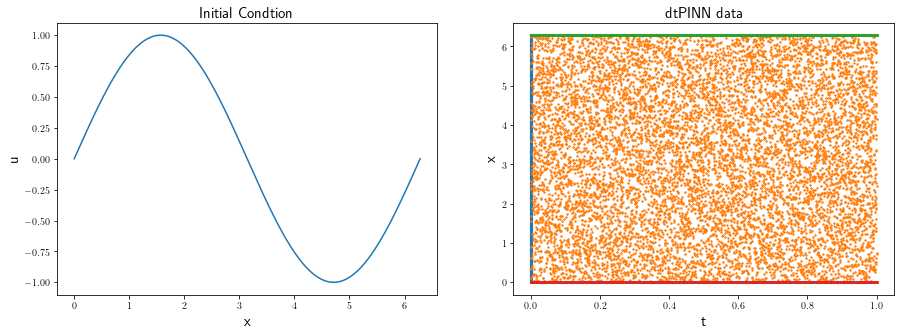

In [4]:
dataPar = generate_trainData(dataPar, userPar)
sample_plot(dataPar, userPar)

## Step 3: Train model and visualize

### Step 3.1: Define training and visualization parameters

In [8]:
### Training visualization parameters
userPar['animation'] = 1; # Boolean for showing/saving snapshots to make animation. If 0, it will just show/save the end of training
userPar['save_fig'] = 0; # Save training figures
userPar['model_name'] = 'convection_PINN_highB' # Name of file to save training snapshots under
userPar['show_fig'] = 1; # Display training figures
userPar['verbose'] = 1 # Print out various training varibles at train time such as loss and iterations
SEED = 0

### Step 3.2: Initalize the model

In [9]:
print('SEED:', SEED); torch.manual_seed(SEED); np.random.seed(SEED);
model = dtPINN(dataPar, userPar)

SEED: 0


### Step 3.3: Train the model

dtPINN
Train Adam:
epoch 100, loss: 46.8652
epoch 200, loss: 44.4472
epoch 300, loss: 43.6067
epoch 400, loss: 41.5862
epoch 500, loss: 35.3075
Training time: 34.3715


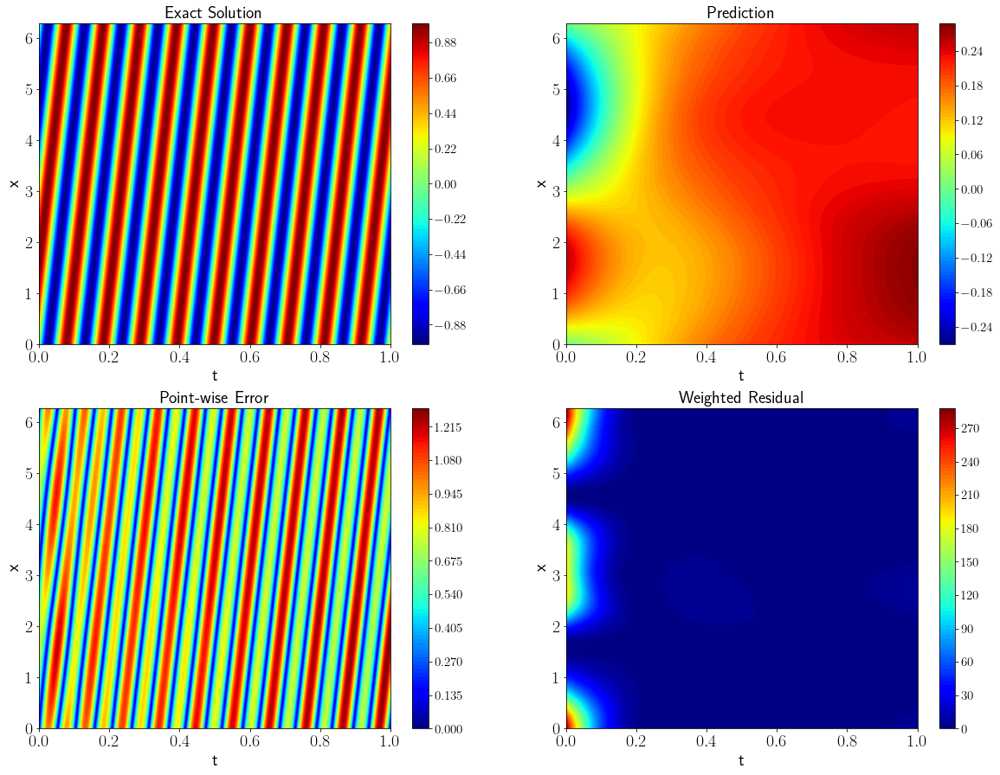

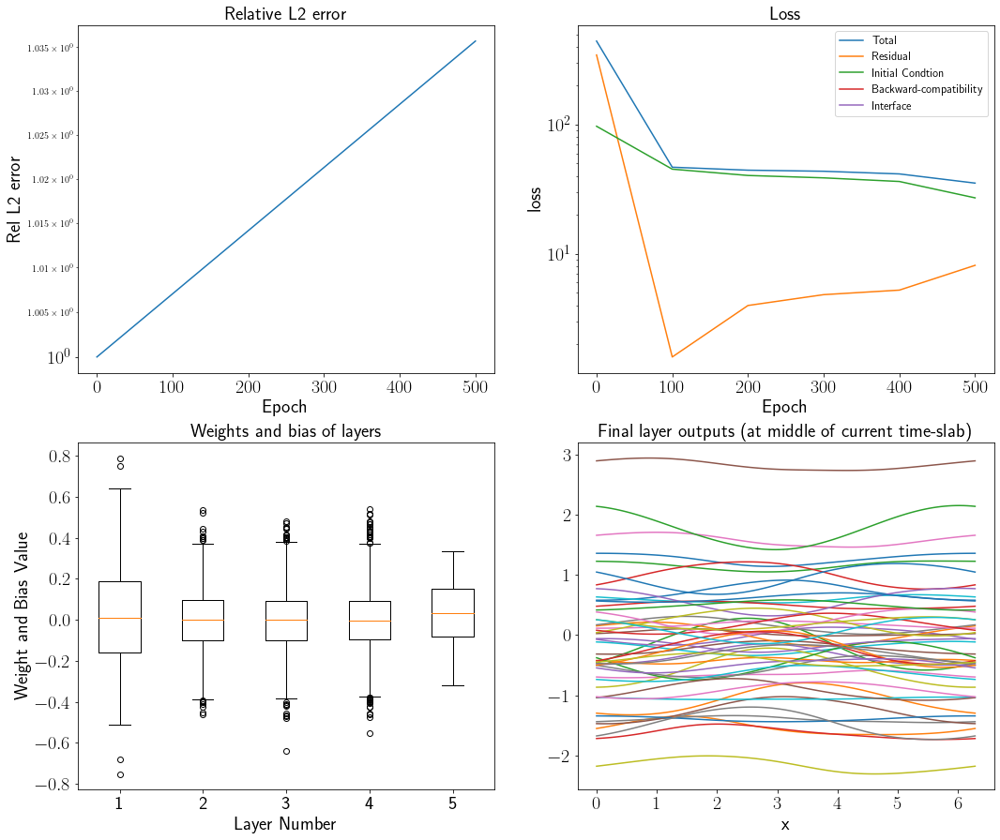

L2-error:  1.0357177008098957
Train L-BFGS:
epoch 100, loss: 8.84713, delta loss: 0.0681505
epoch 200, loss: 5.6827, delta loss: 0.0130076
epoch 300, loss: 4.36502, delta loss: 0.00584555
epoch 400, loss: 3.54698, delta loss: 0.0104227
epoch 500, loss: 3.02393, delta loss: 0.00233221
Training time: 71.7409


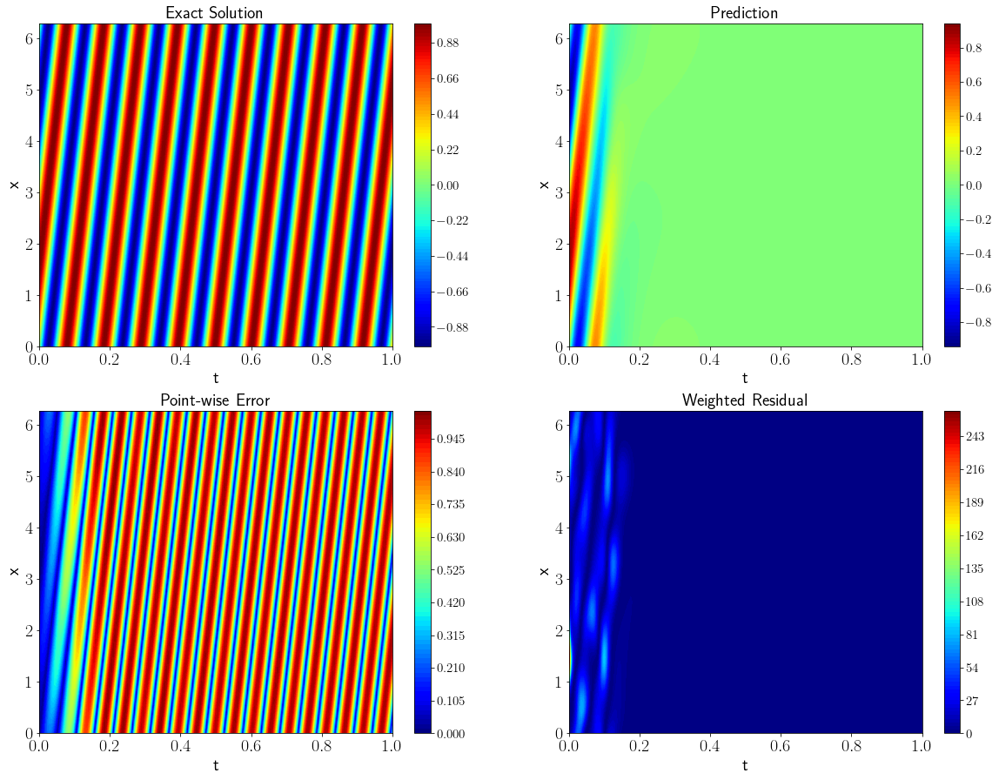

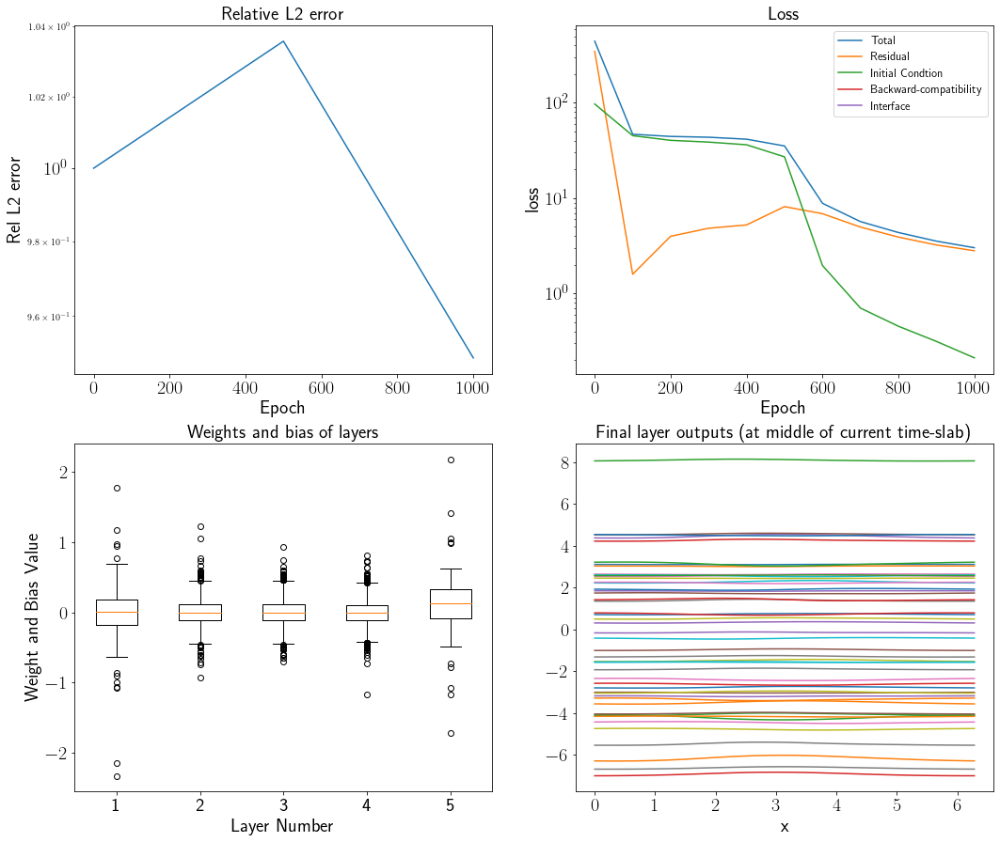

L2-error:  0.9489680074716752
Train L-BFGS:
epoch 100, loss: 2.67641, delta loss: 0.00428534
epoch 200, loss: 2.38861, delta loss: 0.00176835
epoch 300, loss: 2.24453, delta loss: 0.000791311
epoch 400, loss: 2.14555, delta loss: 0.00078392
epoch 500, loss: 2.03727, delta loss: 0.00108314
Training time: 107.0945


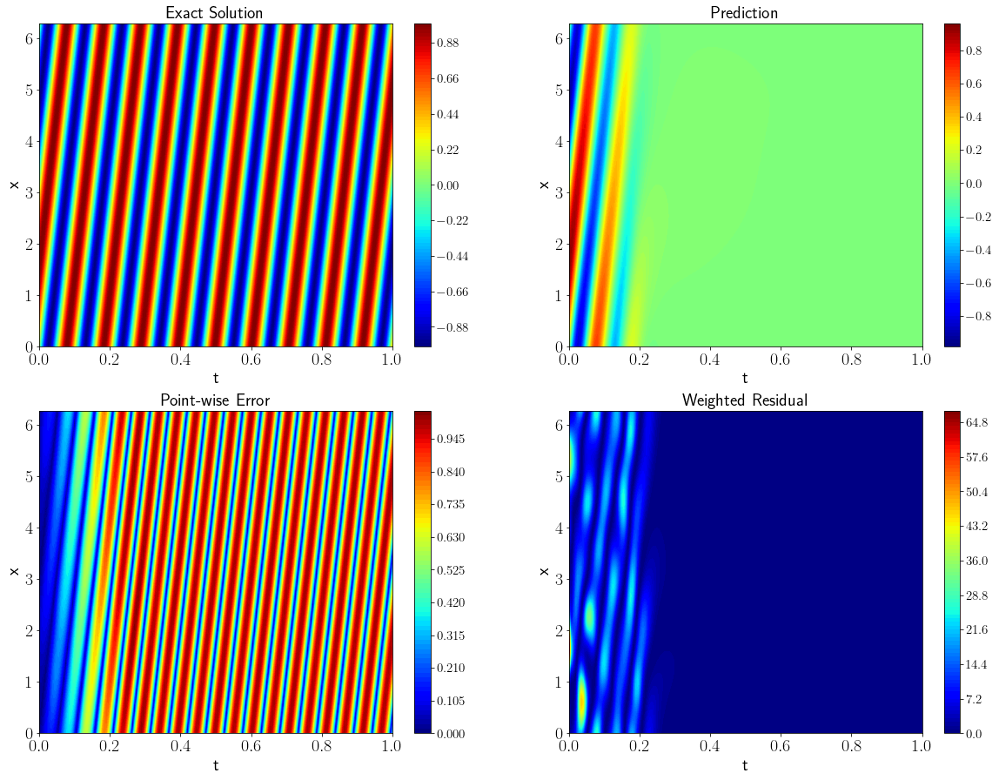

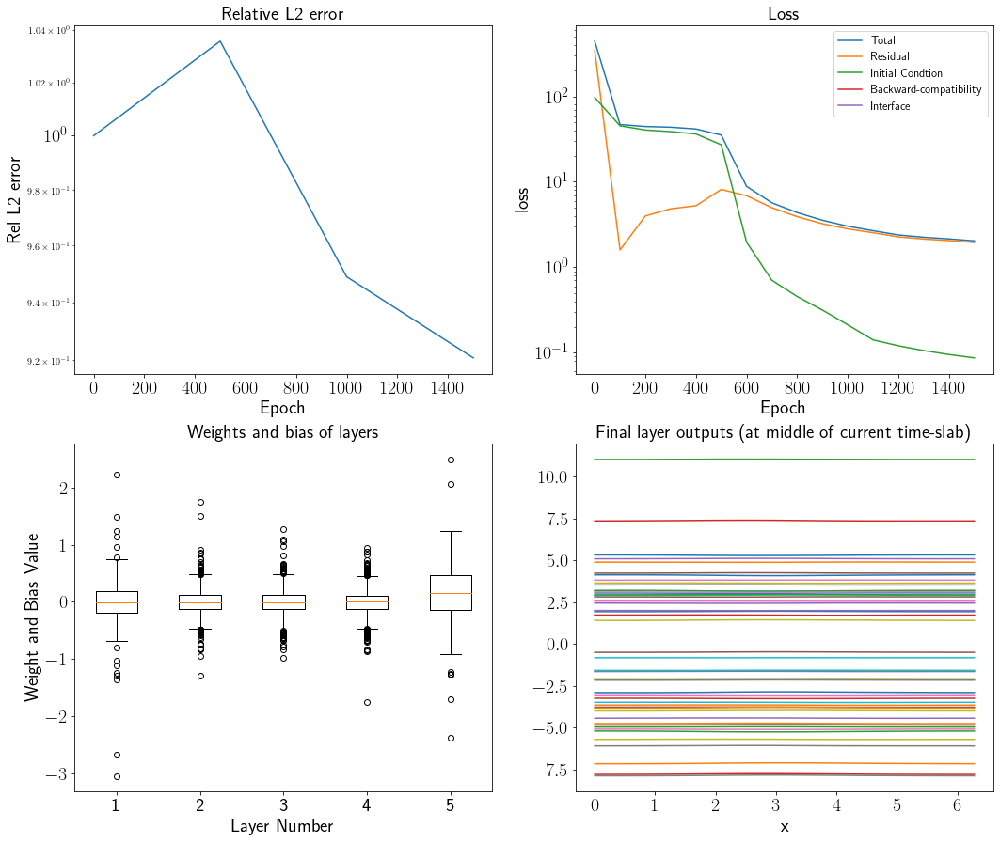

L2-error:  0.9208542313332342
Train L-BFGS:
epoch 100, loss: 1.9334, delta loss: 0.000590563
epoch 200, loss: 1.88717, delta loss: 0.000369072
epoch 300, loss: 1.83582, delta loss: 0.000545621
epoch 400, loss: 1.79312, delta loss: 0.000273228
epoch 500, loss: 1.75271, delta loss: 0.000234485
Training time: 143.1977


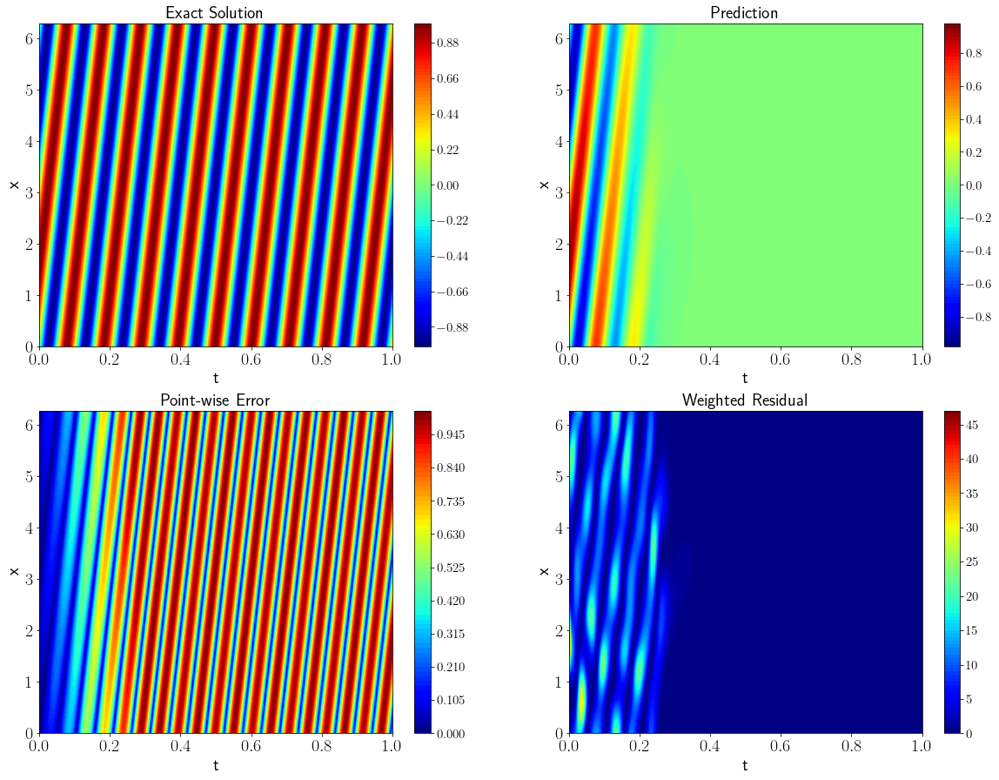

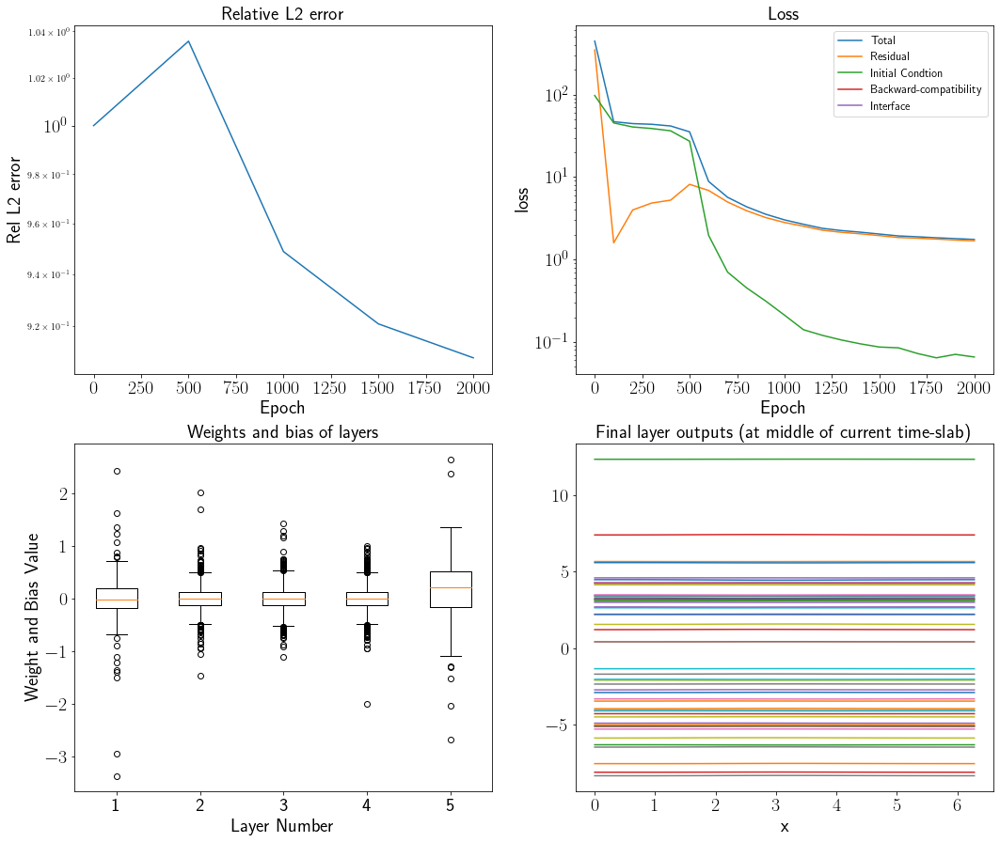

L2-error:  0.9079447176272366
Train L-BFGS:
epoch 100, loss: 1.69985, delta loss: 0.00051105
epoch 200, loss: 1.66257, delta loss: 0.000322938
epoch 300, loss: 1.63138, delta loss: 0.000193477
epoch 400, loss: 1.61038, delta loss: 0.000299335
epoch 500, loss: 1.58657, delta loss: 0.000223517
Training time: 179.7367


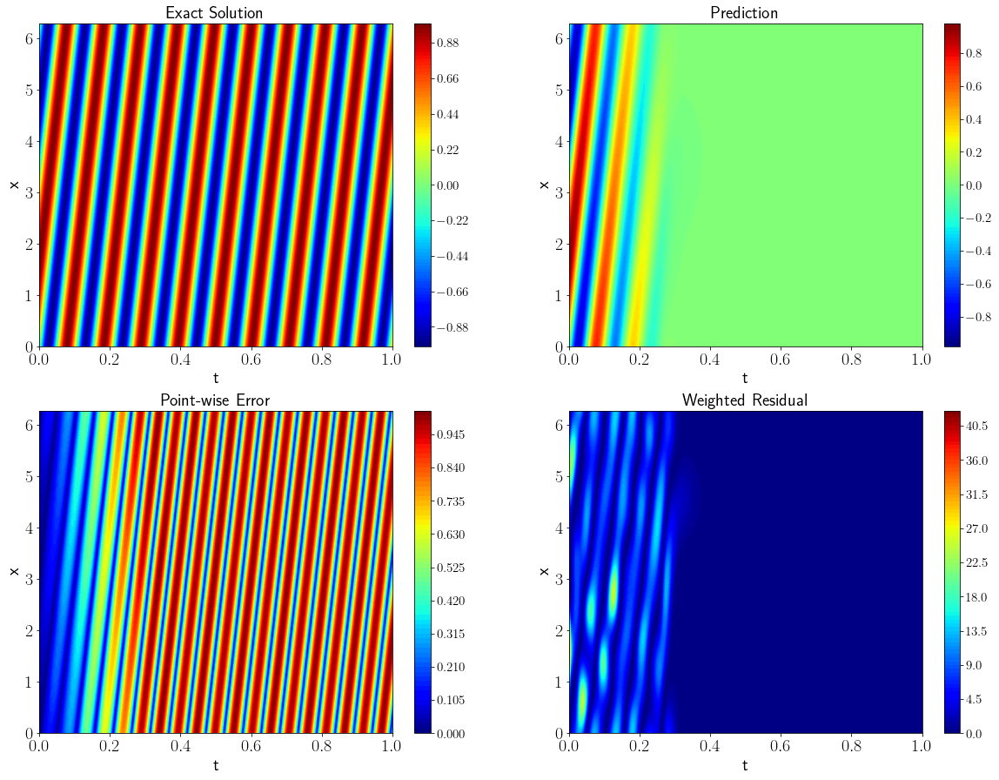

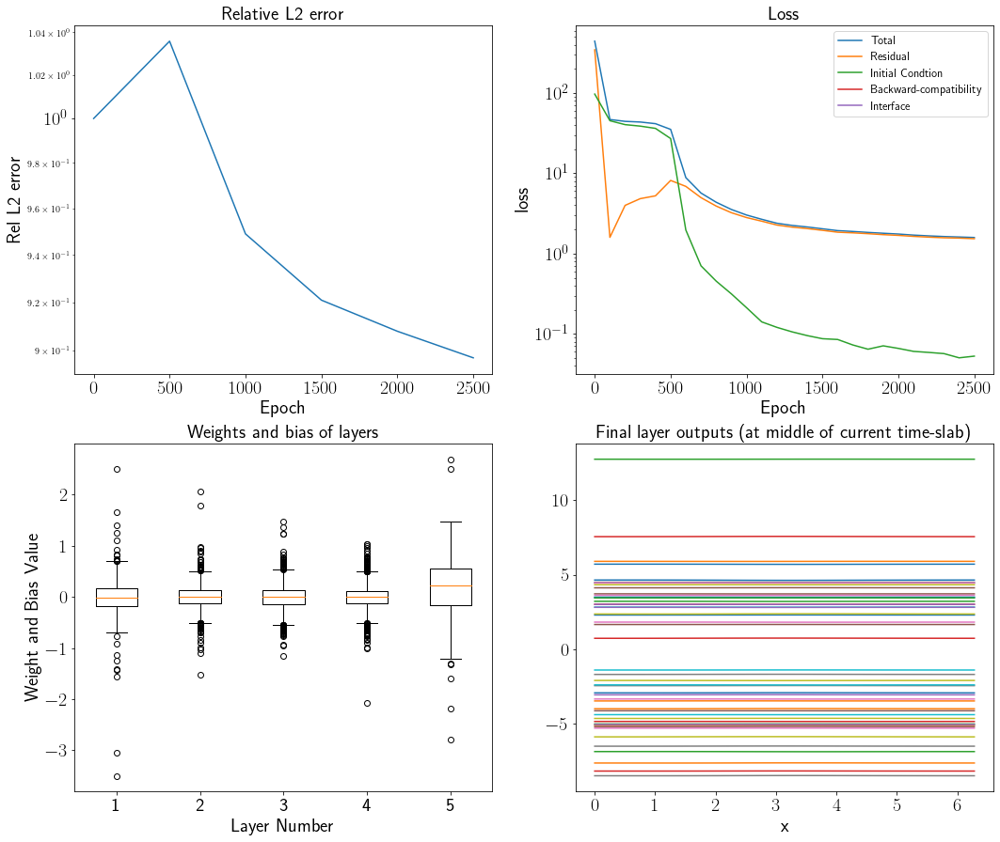

L2-error:  0.8970571571204776
Train L-BFGS:
epoch 100, loss: 1.55922, delta loss: 0.000265598
epoch 200, loss: 1.53196, delta loss: 0.000210166
epoch 300, loss: 1.51337, delta loss: 0.00019896
epoch 400, loss: 1.49321, delta loss: 0.000139117
epoch 500, loss: 1.47327, delta loss: 0.000280738
Training time: 215.3855


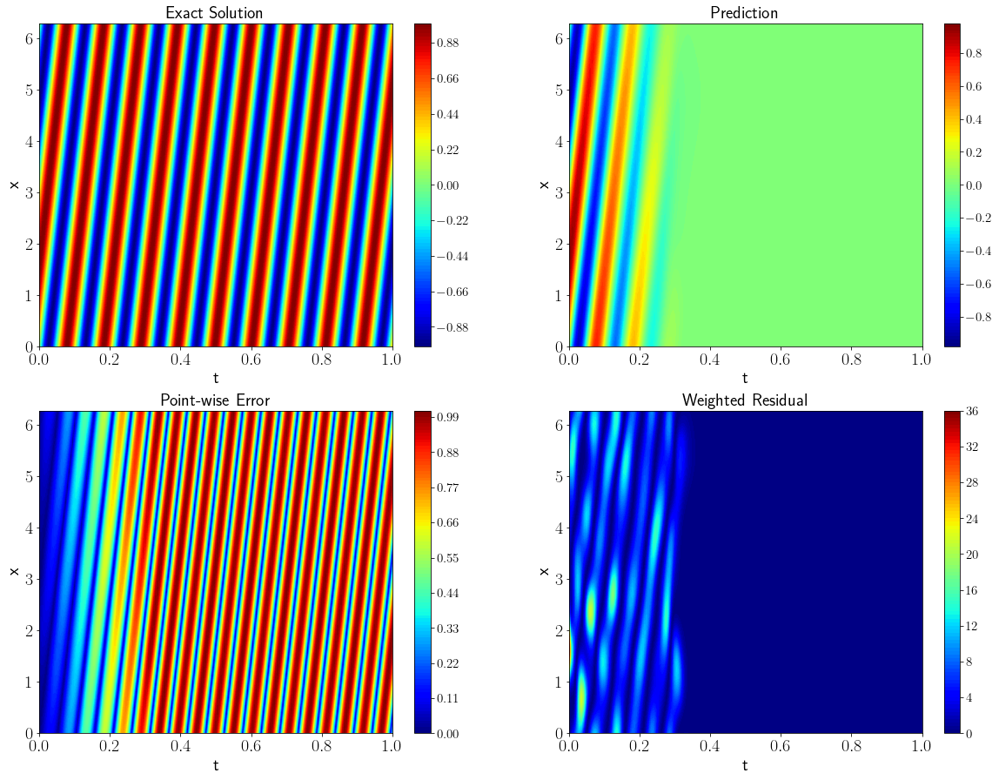

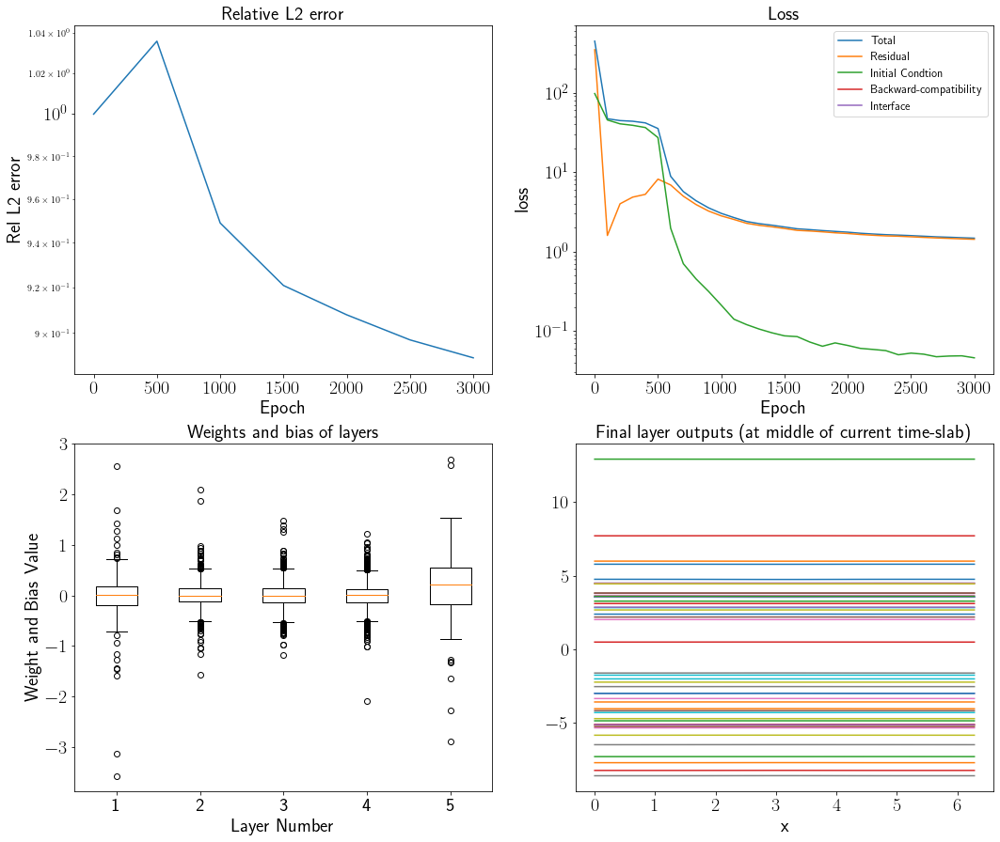

L2-error:  0.8893483964205943
Train L-BFGS:
epoch 100, loss: 1.45795, delta loss: 0.000156164
epoch 200, loss: 1.44335, delta loss: 0.000217438
epoch 300, loss: 1.4168, delta loss: 0.000207067
epoch 400, loss: 1.3917, delta loss: 0.00032568
epoch 500, loss: 1.3733, delta loss: 0.000112176
Training time: 251.3572


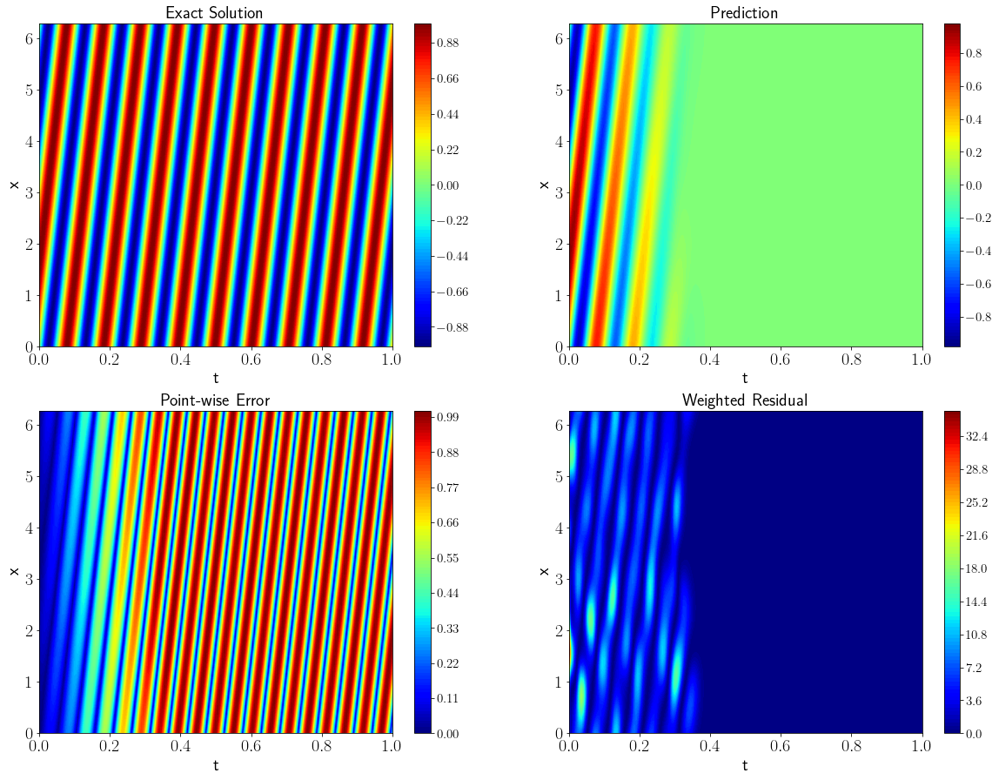

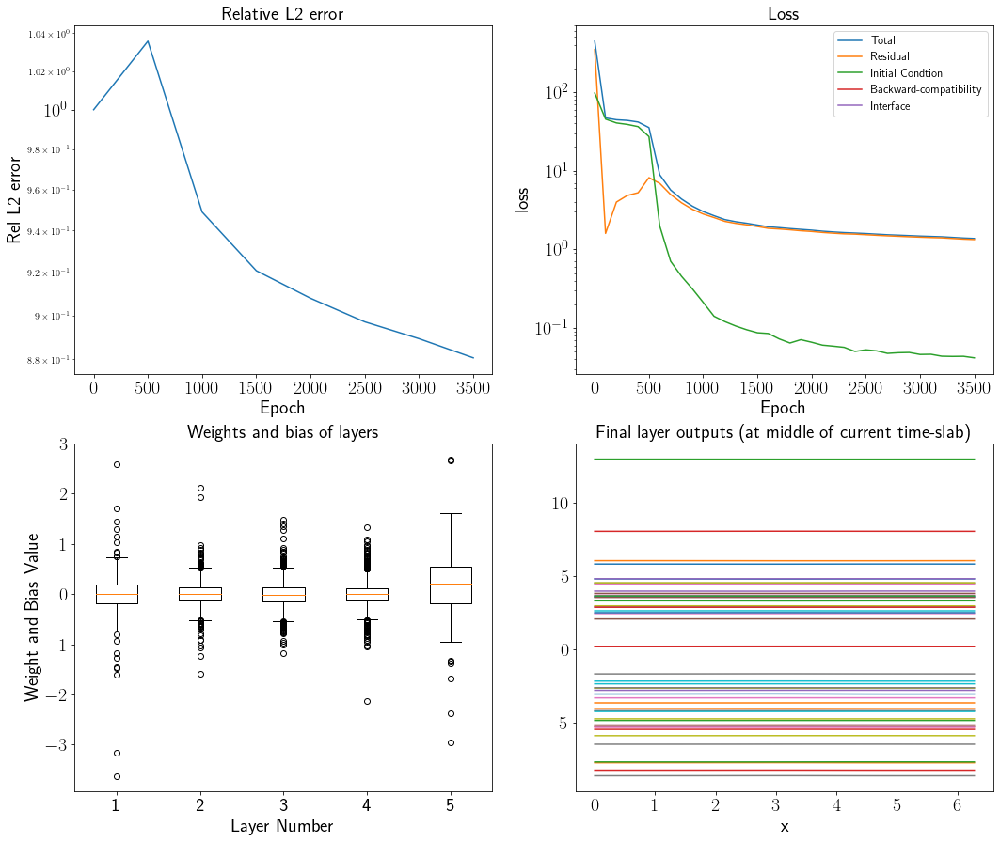

L2-error:  0.8806812234537011
Train L-BFGS:
epoch 100, loss: 1.35819, delta loss: 0.000141263
epoch 200, loss: 1.34372, delta loss: 0.000106812
epoch 300, loss: 1.33002, delta loss: 4.69685e-05
epoch 400, loss: 1.32234, delta loss: 0.000140548
epoch 500, loss: 1.31503, delta loss: 8.34465e-05
Training time: 285.2025


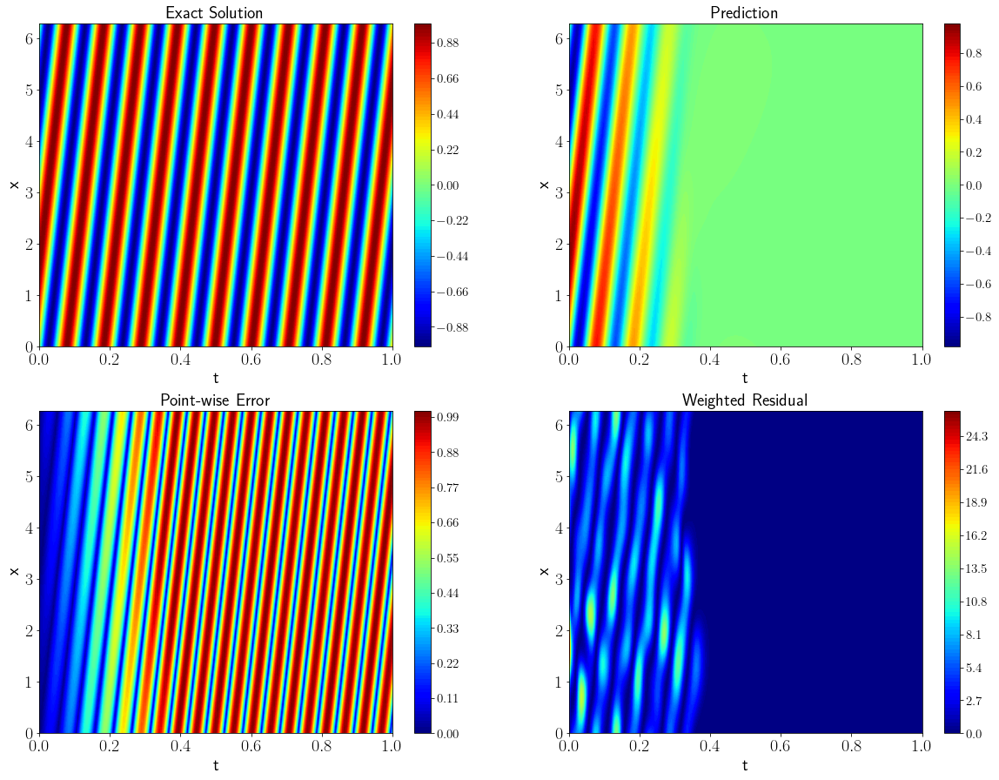

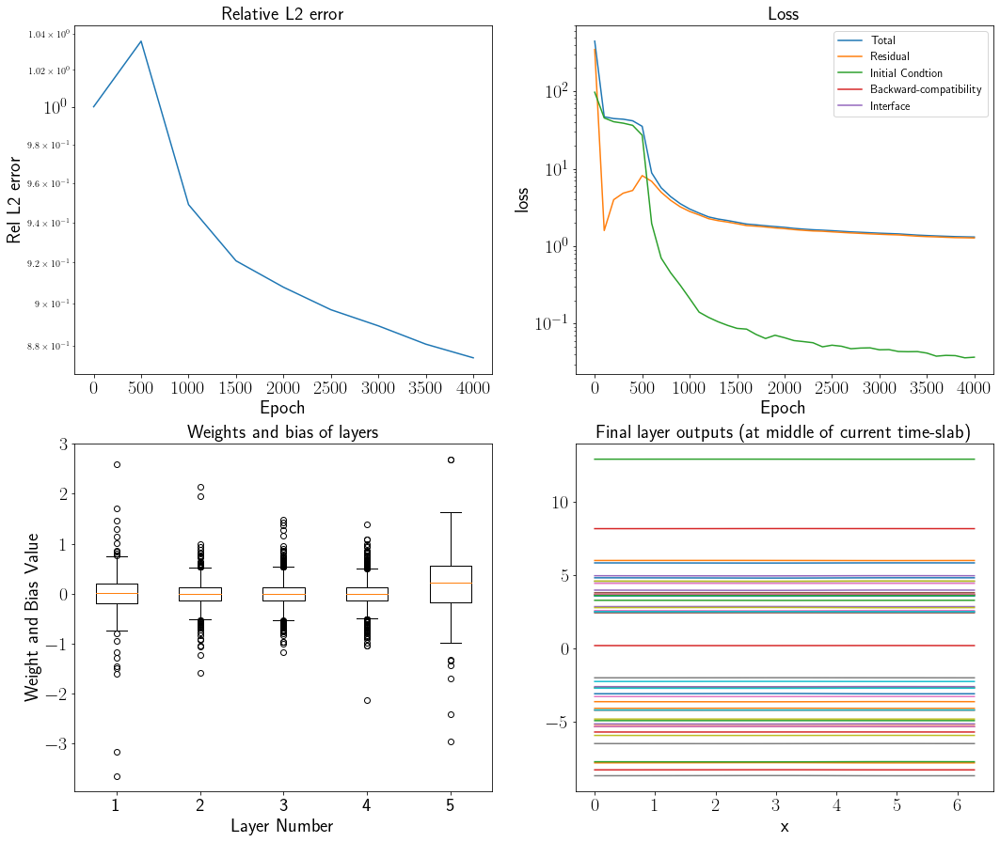

L2-error:  0.8742646187195701
Train L-BFGS:
epoch 100, loss: 1.306, delta loss: 9.38177e-05
epoch 200, loss: 1.29623, delta loss: 0.000102282
epoch 300, loss: 1.28735, delta loss: 8.36849e-05
epoch 400, loss: 1.27952, delta loss: 8.86917e-05
epoch 500, loss: 1.27248, delta loss: 3.38554e-05
Training time: 319.0618


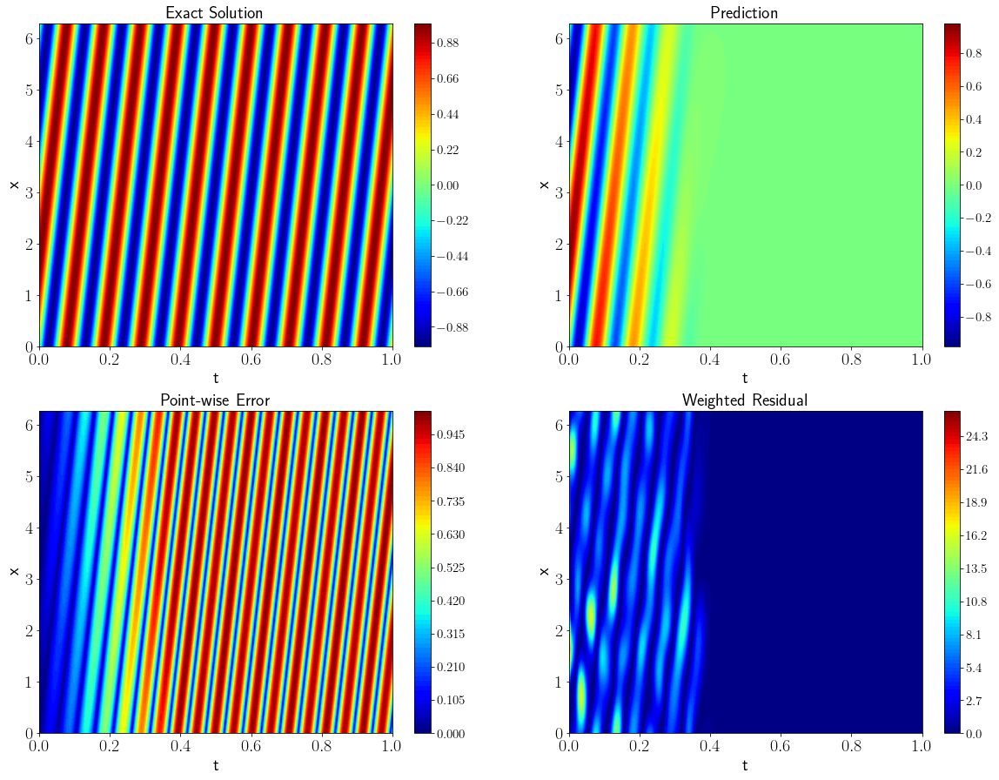

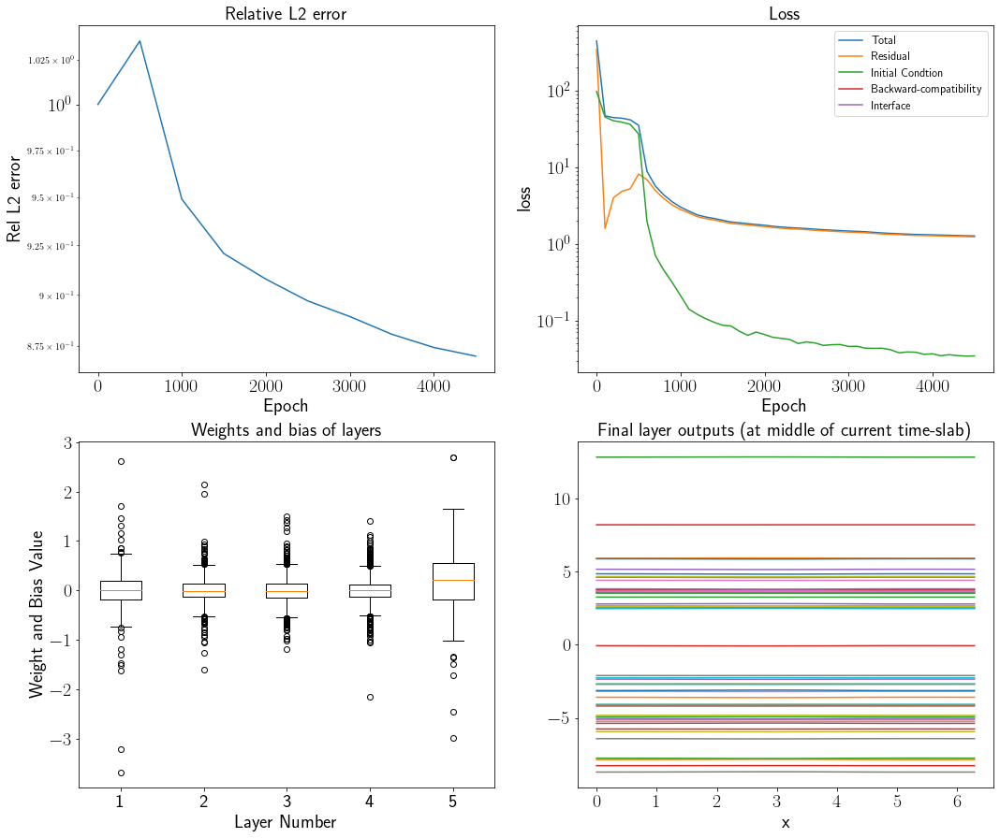

L2-error:  0.8700833225903408
Train L-BFGS:
epoch 100, loss: 1.26015, delta loss: 0.000242233
epoch 200, loss: 1.24697, delta loss: 0.000127912
epoch 300, loss: 1.23527, delta loss: 0.000100255
epoch 400, loss: 1.22326, delta loss: 0.000157833
epoch 500, loss: 1.20934, delta loss: 9.67979e-05
Training time: 353.3260


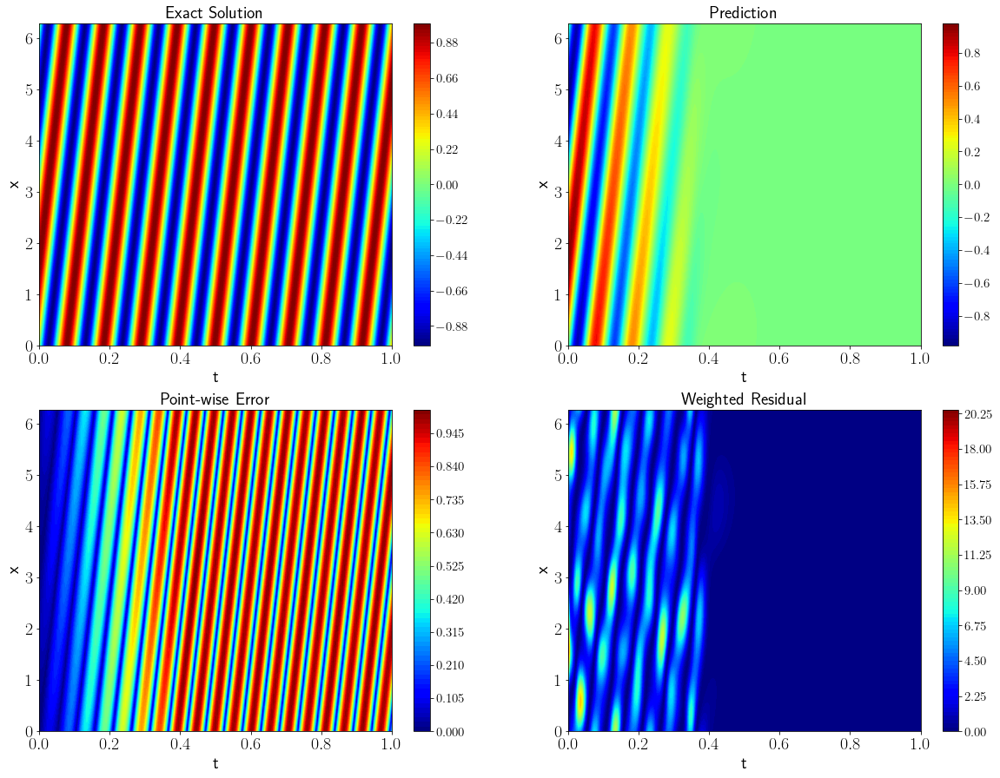

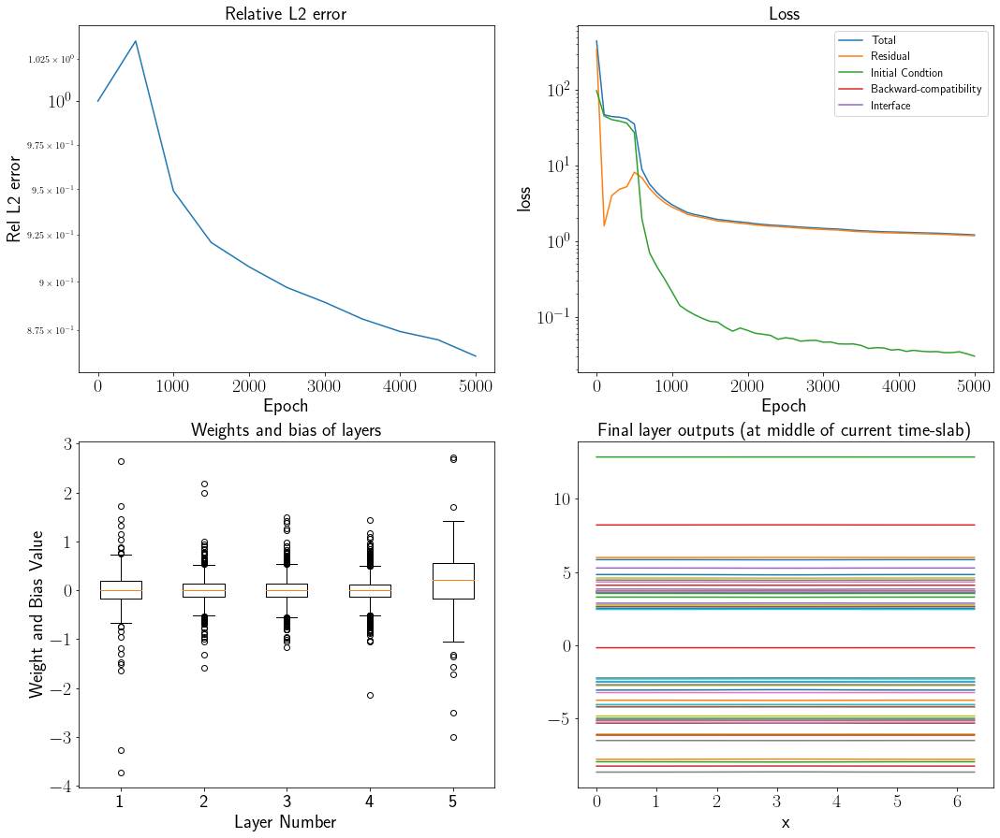

L2-error:  0.8618179046816565
Train L-BFGS:
epoch 100, loss: 1.19842, delta loss: 0.000139117
epoch 200, loss: 1.18868, delta loss: 5.40018e-05
epoch 300, loss: 1.17739, delta loss: 8.34465e-05
epoch 400, loss: 1.16852, delta loss: 6.87838e-05
epoch 500, loss: 1.1615, delta loss: 5.44786e-05
Training time: 386.6335


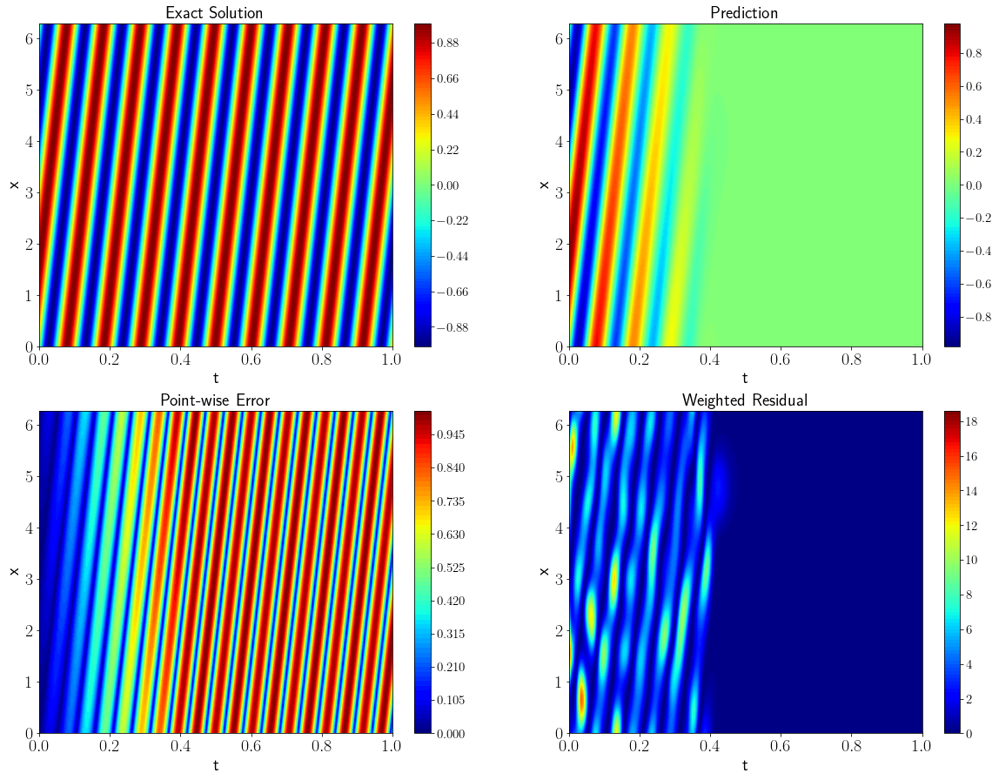

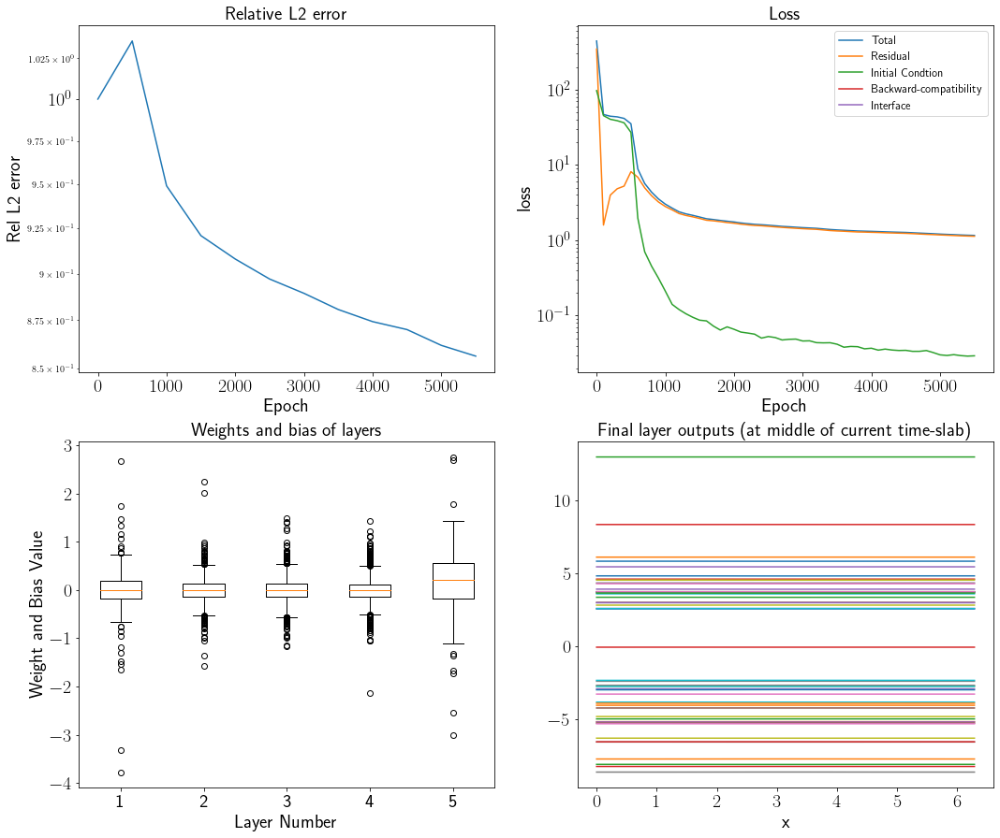

L2-error:  0.856246647169652
Train L-BFGS:
epoch 100, loss: 1.15445, delta loss: 5.87702e-05
epoch 200, loss: 1.14884, delta loss: 7.10487e-05
epoch 300, loss: 1.14259, delta loss: 5.56707e-05
epoch 400, loss: 1.13715, delta loss: 3.89814e-05
epoch 500, loss: 1.12968, delta loss: 4.49419e-05
Training time: 419.6351


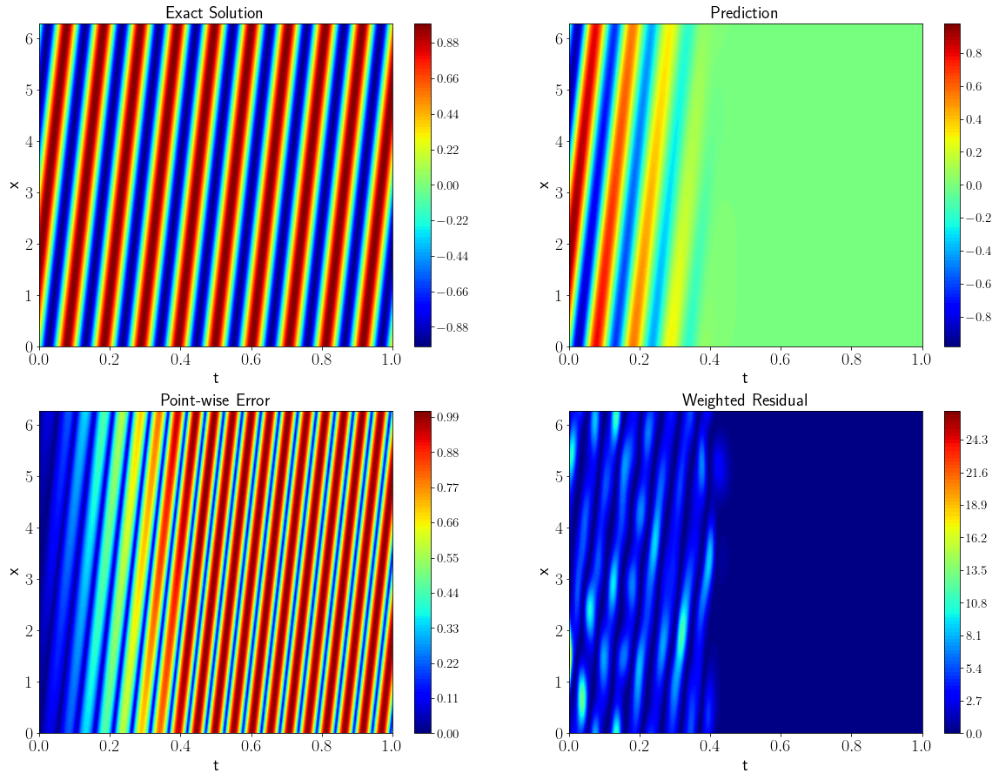

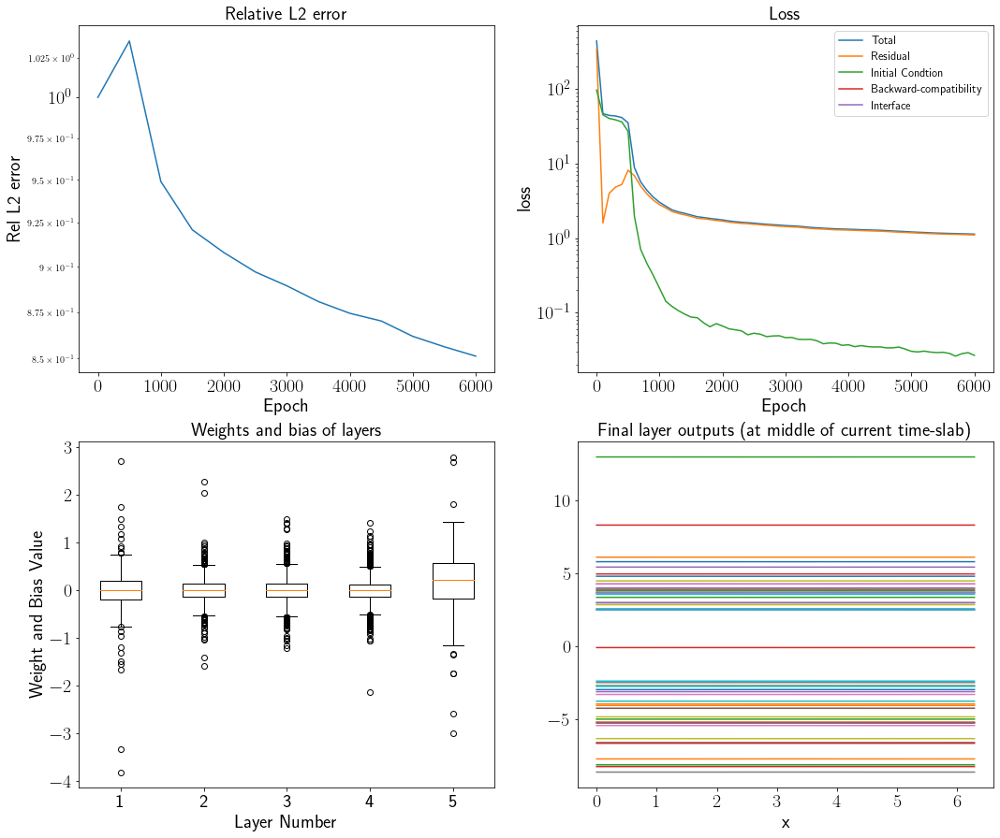

L2-error:  0.8512615934501664
Train L-BFGS:
epoch 100, loss: 1.12303, delta loss: 3.91006e-05
epoch 200, loss: 1.11724, delta loss: 5.47171e-05
epoch 300, loss: 1.11104, delta loss: 6.62804e-05
epoch 400, loss: 1.10528, delta loss: 5.76973e-05
epoch 500, loss: 1.09859, delta loss: 0.000133514
Training time: 453.1485


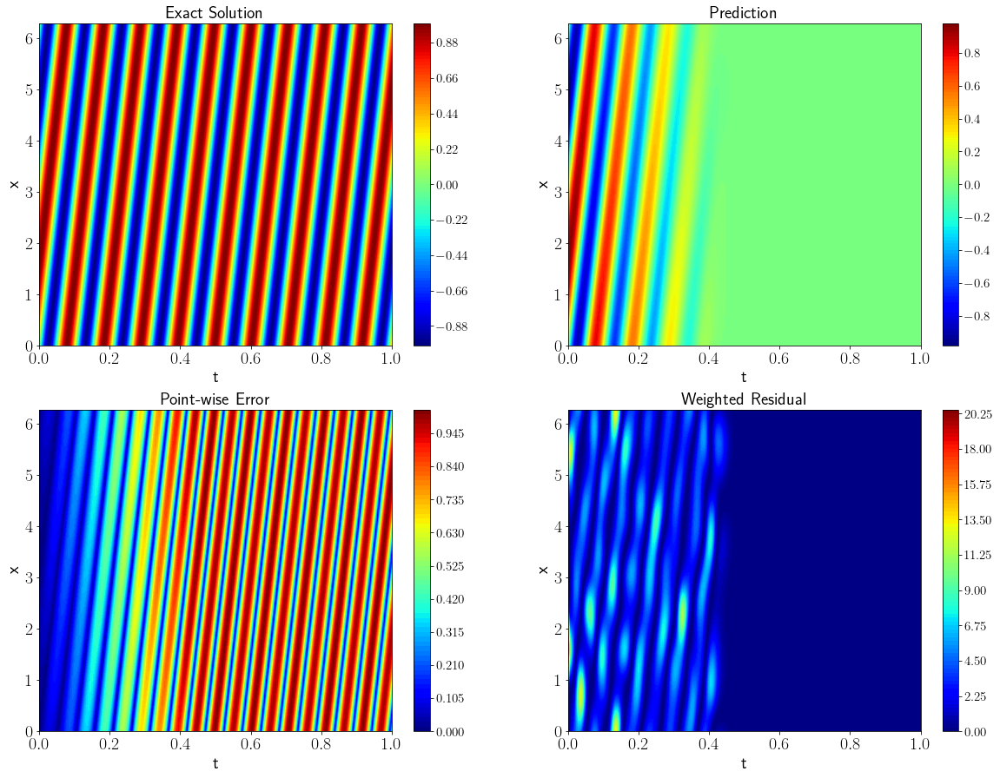

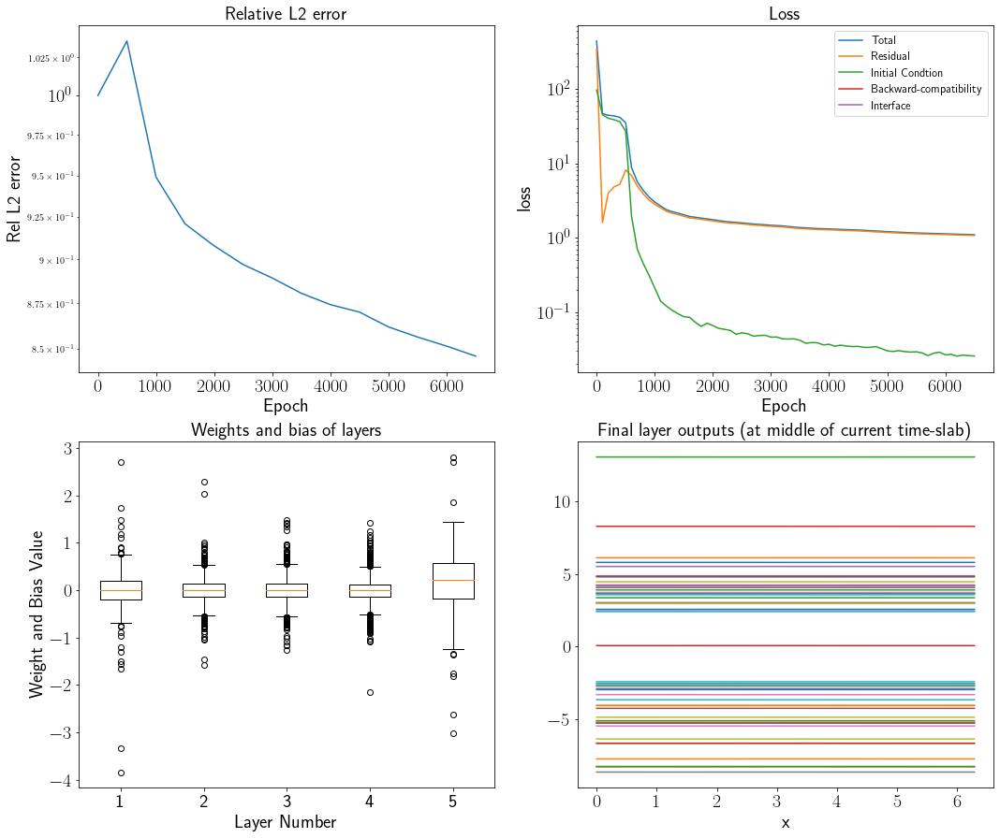

L2-error:  0.8458057300666293
Train L-BFGS:
epoch 100, loss: 1.09145, delta loss: 7.67708e-05
epoch 200, loss: 1.08605, delta loss: 5.47171e-05
epoch 300, loss: 1.08167, delta loss: 4.00543e-05
epoch 400, loss: 1.07681, delta loss: 4.74453e-05
epoch 500, loss: 1.06665, delta loss: 8.7142e-05
Training time: 485.8612


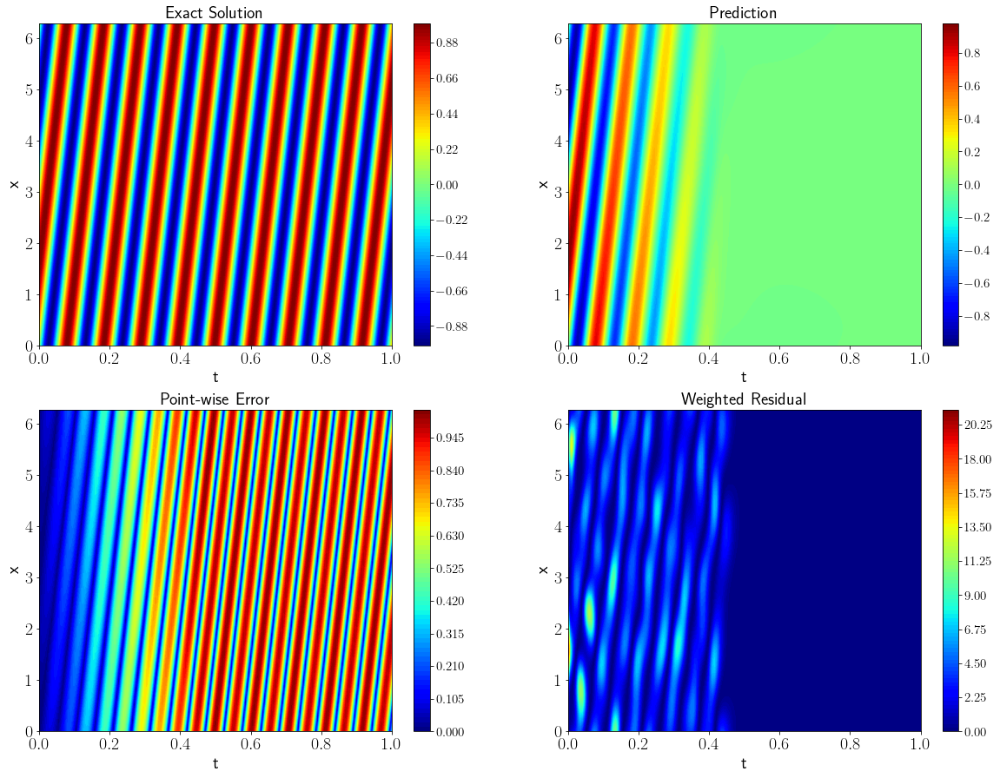

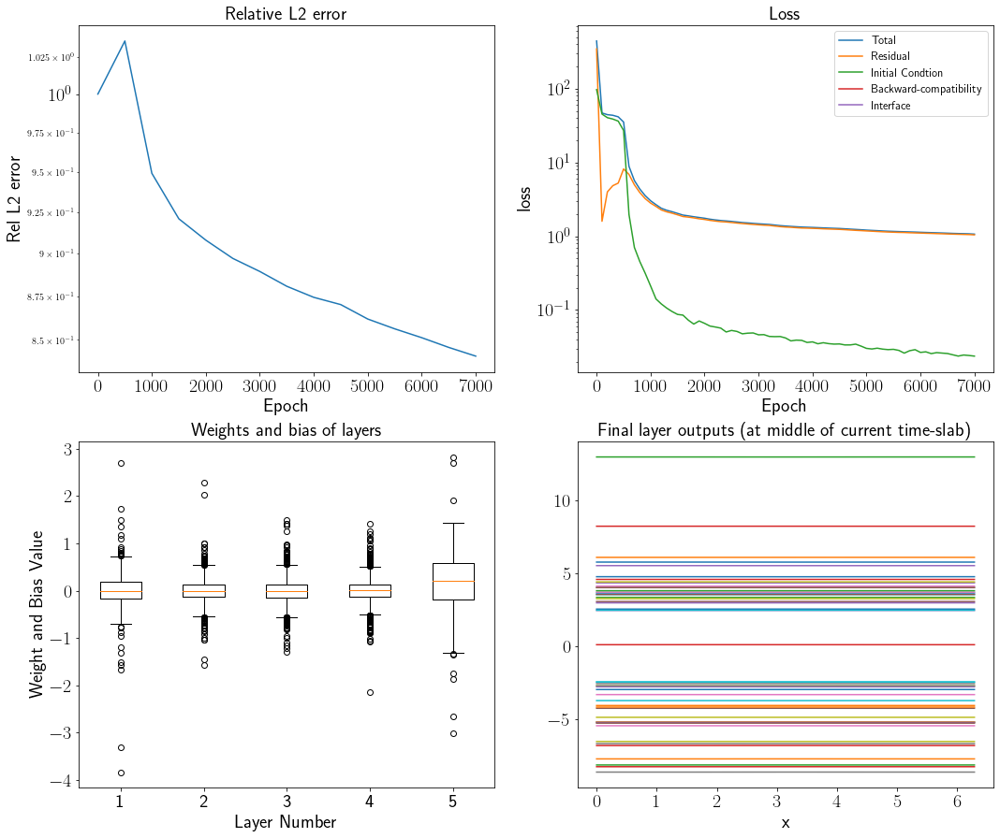

L2-error:  0.8409453296980549
Train L-BFGS:
epoch 100, loss: 1.06007, delta loss: 5.51939e-05
epoch 200, loss: 1.05334, delta loss: 3.11136e-05
epoch 300, loss: 1.04768, delta loss: 4.50611e-05
epoch 400, loss: 1.04254, delta loss: 6.98566e-05
epoch 500, loss: 1.03867, delta loss: 4.22001e-05
Training time: 519.0168


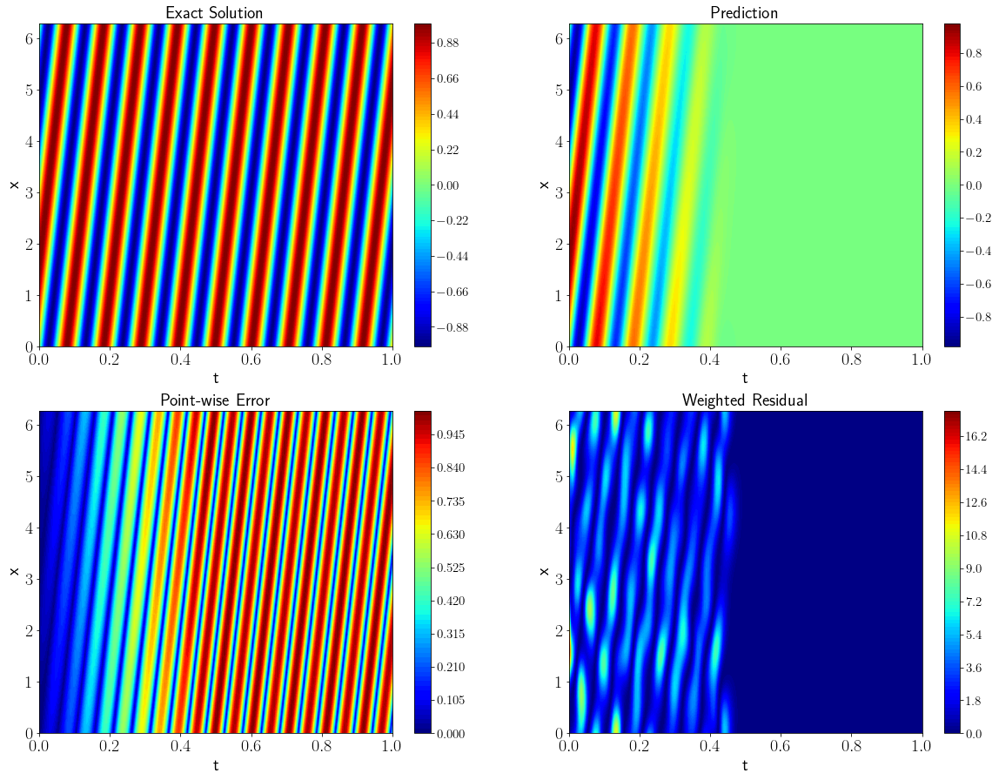

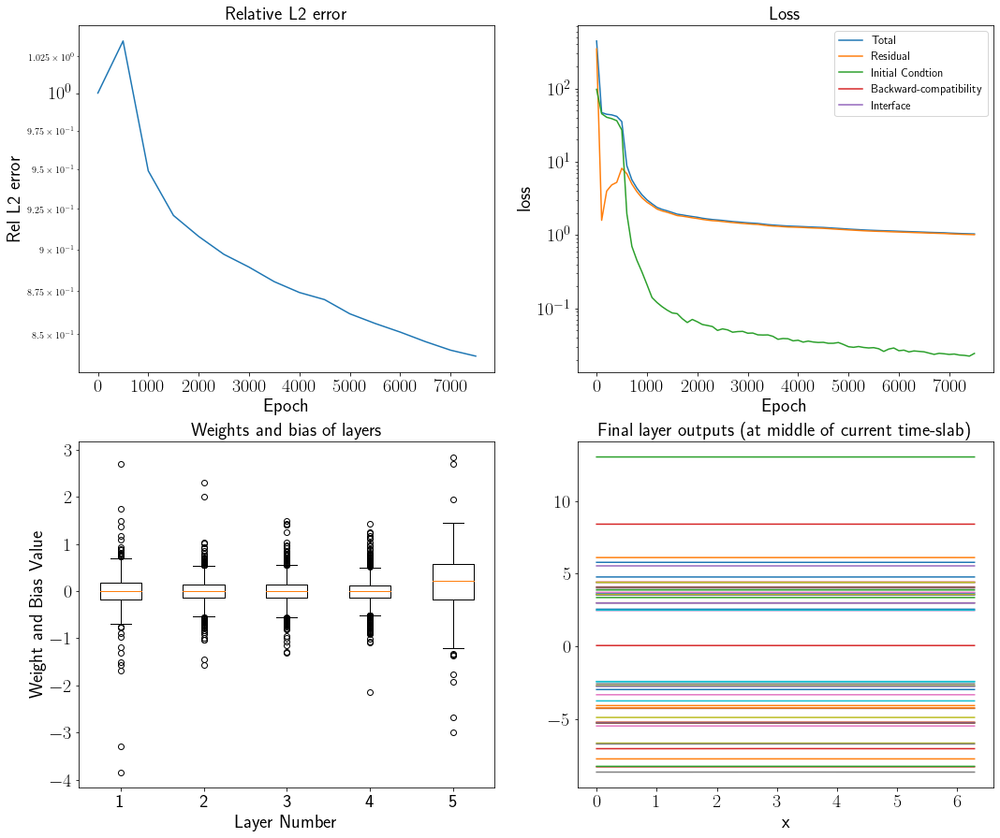

L2-error:  0.837574861069048
Train L-BFGS:
epoch 100, loss: 1.03487, delta loss: 3.69549e-05
epoch 200, loss: 1.03161, delta loss: 3.23057e-05
epoch 300, loss: 1.02884, delta loss: 3.5882e-05
epoch 400, loss: 1.02621, delta loss: 2.74181e-05
epoch 500, loss: 1.02341, delta loss: 3.33786e-05
Training time: 552.1618


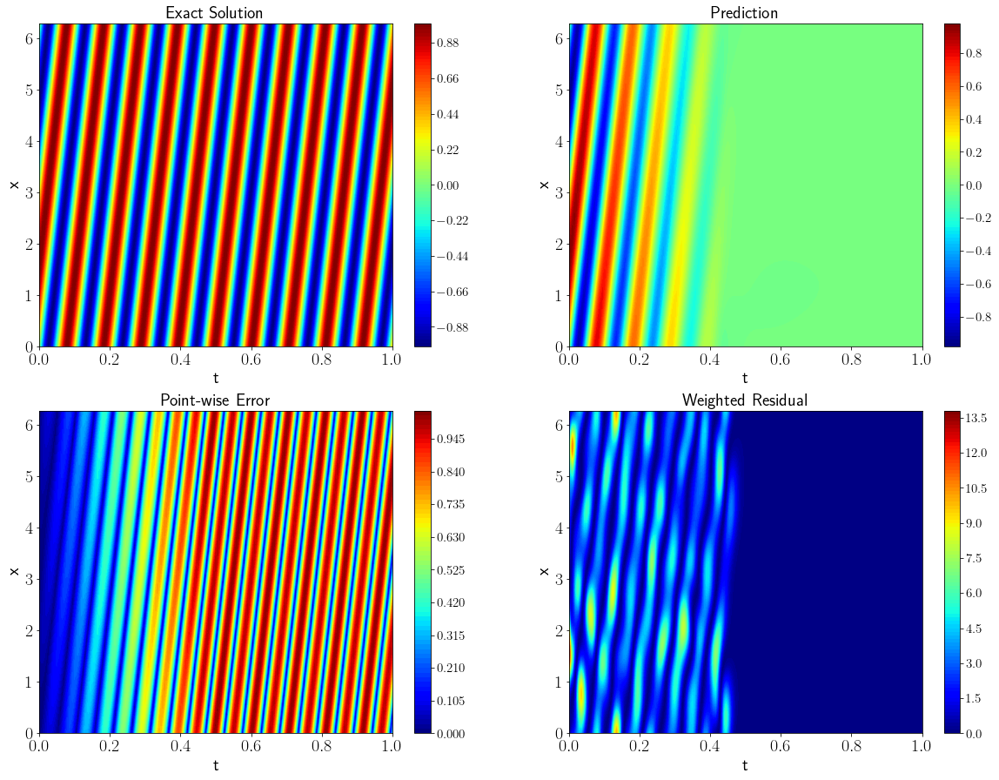

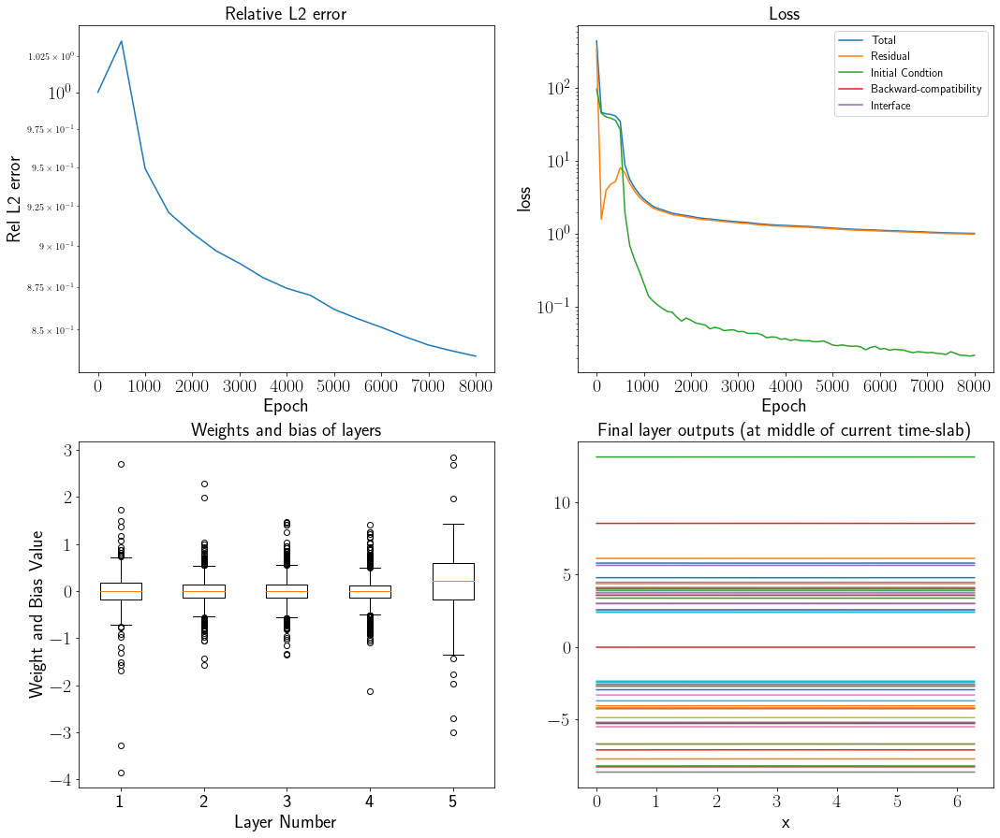

L2-error:  0.8345814557624758
Train L-BFGS:
epoch 100, loss: 1.02003, delta loss: 2.64645e-05
epoch 200, loss: 1.01683, delta loss: 1.90735e-05
epoch 300, loss: 1.01344, delta loss: 3.44515e-05
epoch 400, loss: 1.01007, delta loss: 1.5974e-05
epoch 500, loss: 1.00538, delta loss: 4.81606e-05
Training time: 586.1670


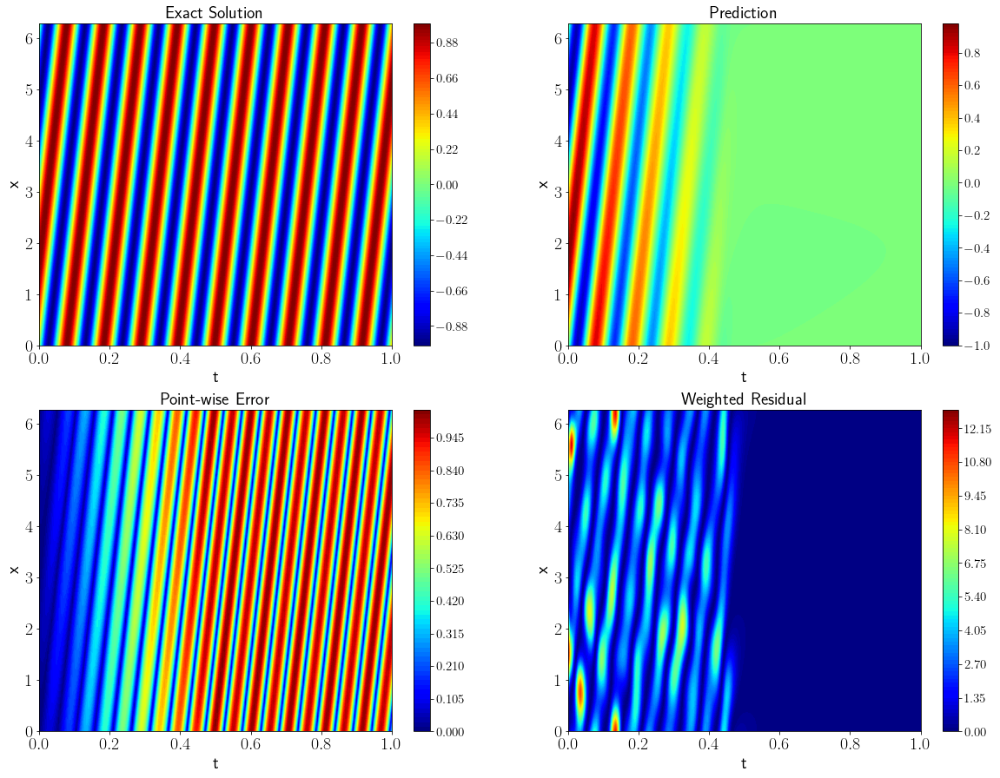

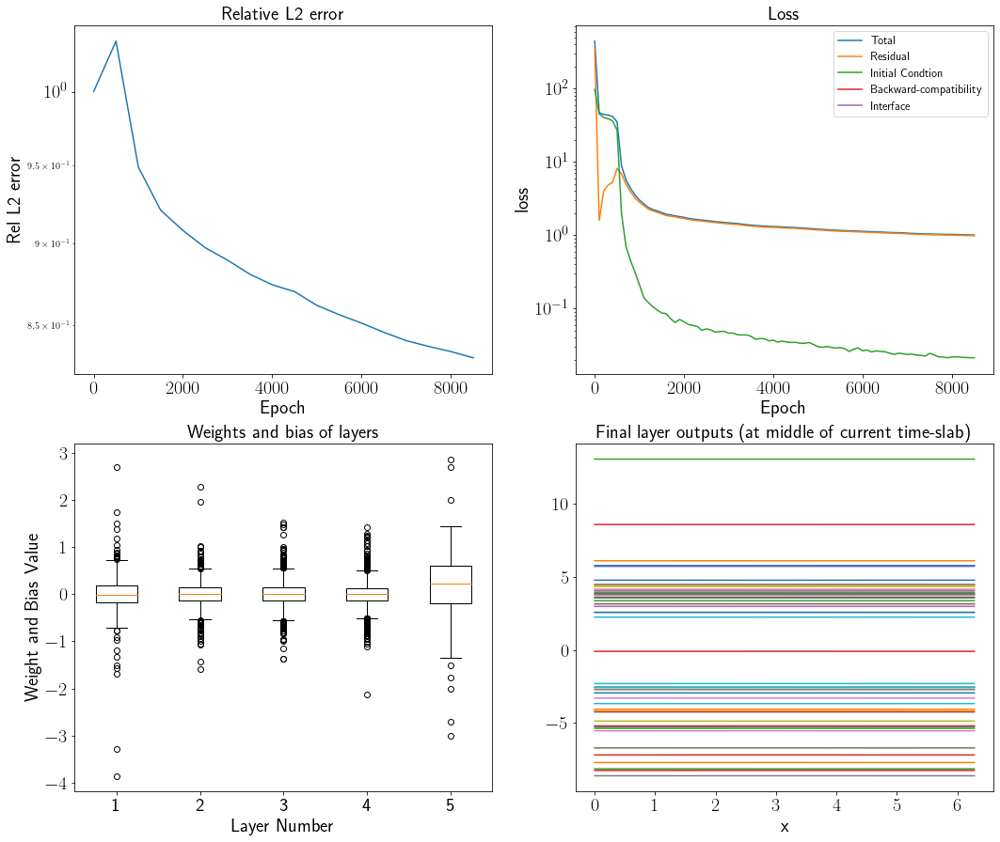

L2-error:  0.8309556227563896
Train L-BFGS:
epoch 100, loss: 1.00137, delta loss: 4.93526e-05
epoch 200, loss: 0.995369, delta loss: 3.38554e-05
epoch 300, loss: 0.99174, delta loss: 5.96046e-05
epoch 400, loss: 0.987503, delta loss: 4.45843e-05
epoch 500, loss: 0.983167, delta loss: 3.71933e-05
Training time: 619.0447


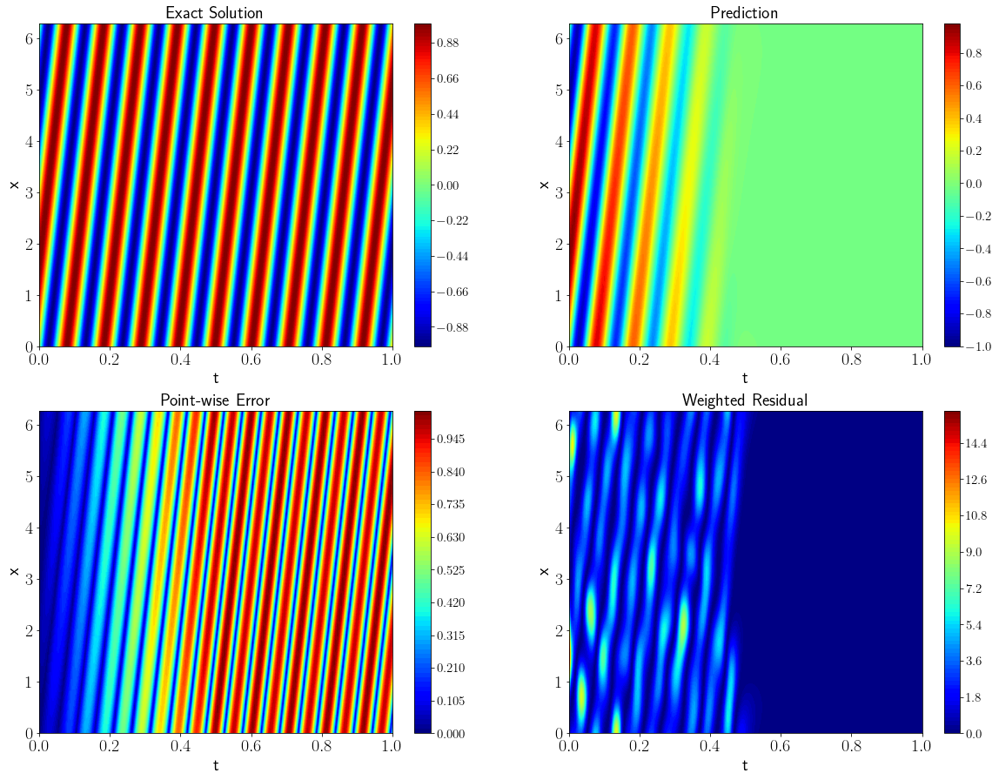

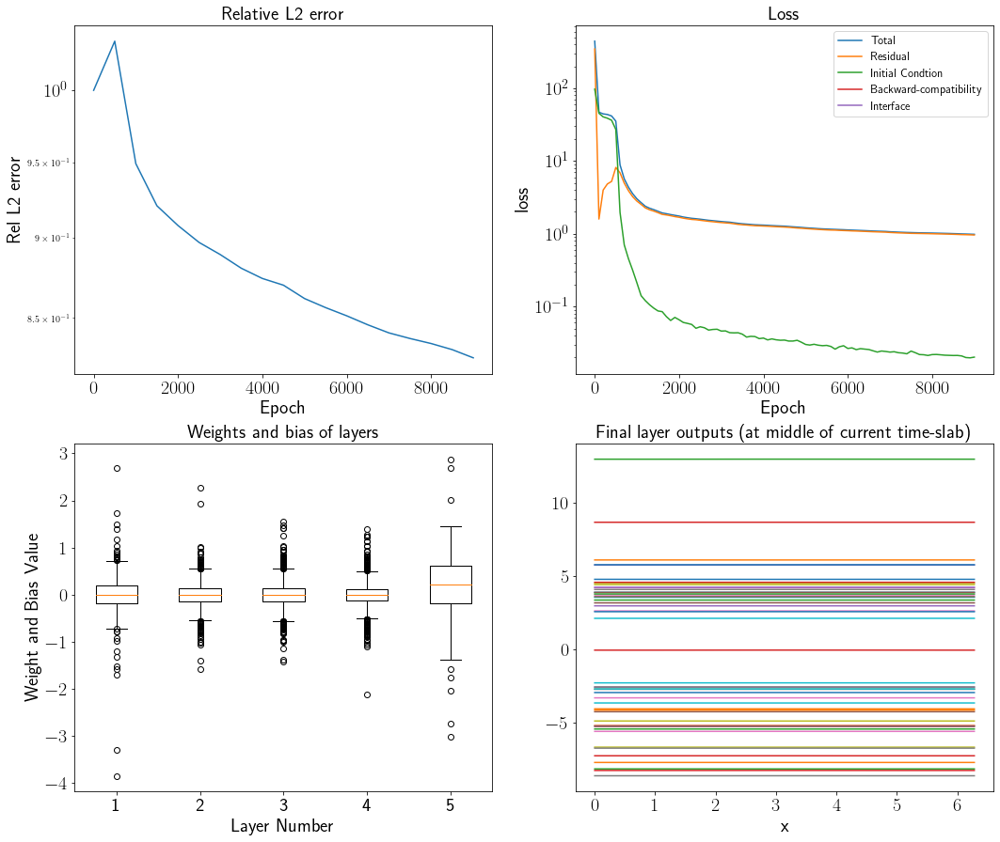

L2-error:  0.8260975351658995
Train L-BFGS:
epoch 100, loss: 0.980327, delta loss: 2.71201e-05
epoch 200, loss: 0.977278, delta loss: 1.8537e-05
epoch 300, loss: 0.973673, delta loss: 3.54052e-05
epoch 400, loss: 0.9691, delta loss: 6.03795e-05
epoch 500, loss: 0.965146, delta loss: 4.19617e-05
Training time: 653.3149


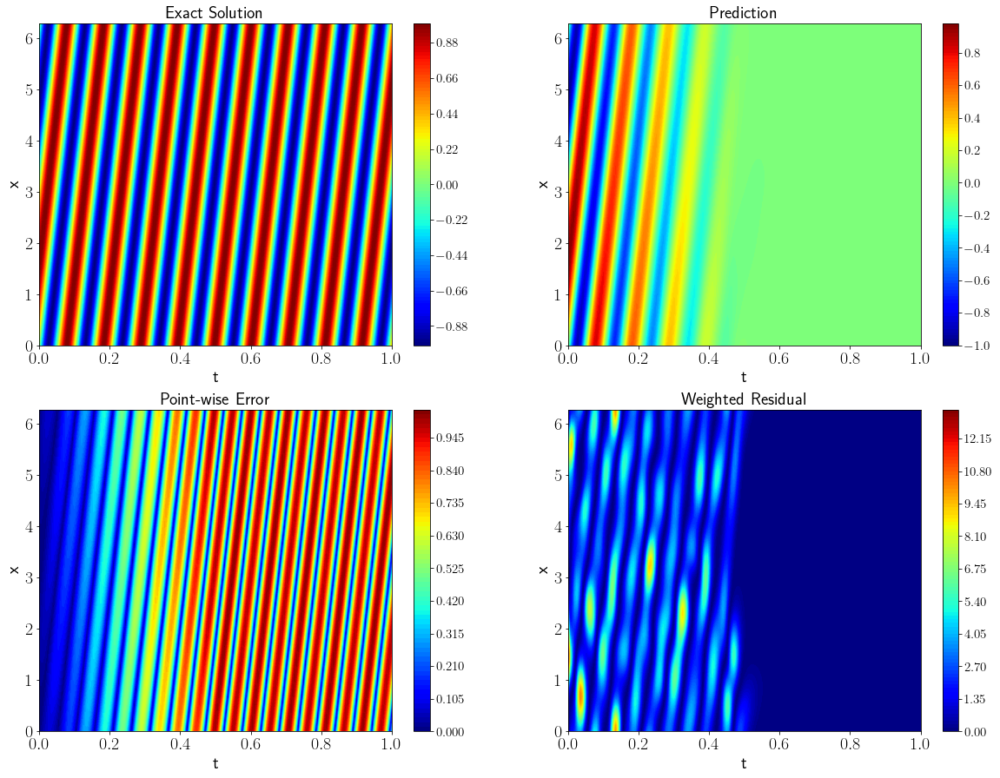

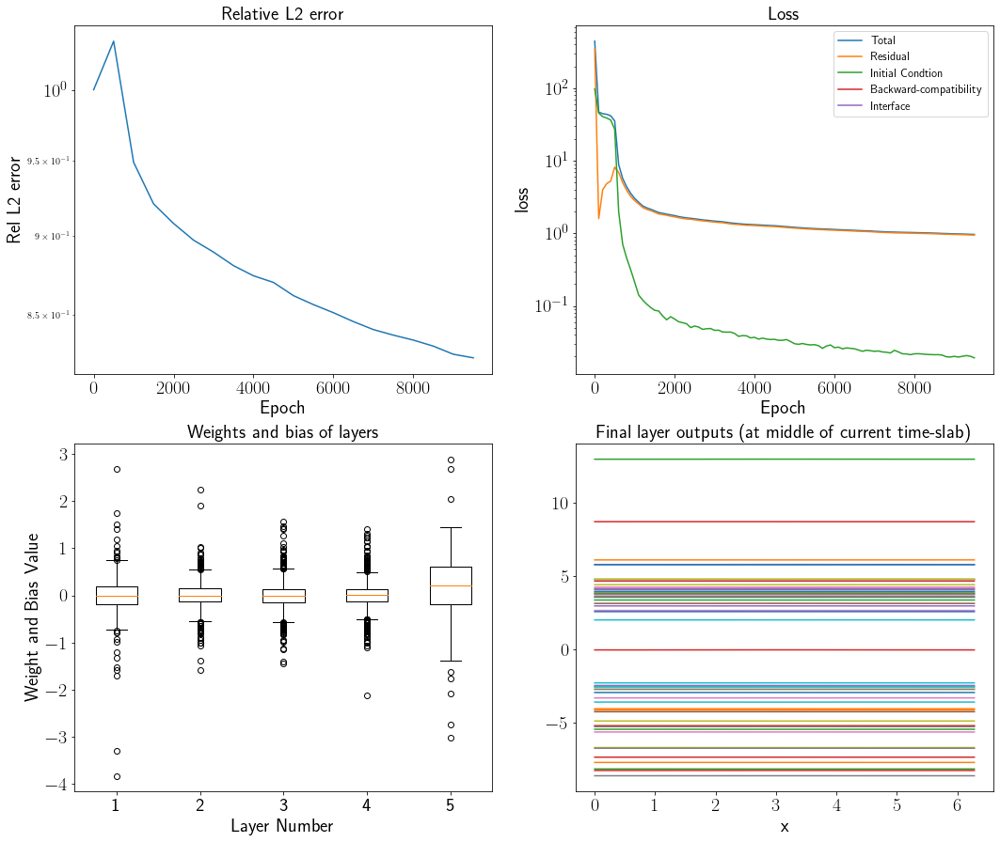

L2-error:  0.8239591775828017
Train L-BFGS:
epoch 100, loss: 0.959458, delta loss: 7.92742e-05
epoch 200, loss: 0.953897, delta loss: 3.89814e-05
epoch 300, loss: 0.950019, delta loss: 6.21676e-05
epoch 400, loss: 0.945033, delta loss: 5.76973e-05
epoch 500, loss: 0.941295, delta loss: 3.40343e-05
Training time: 687.0142


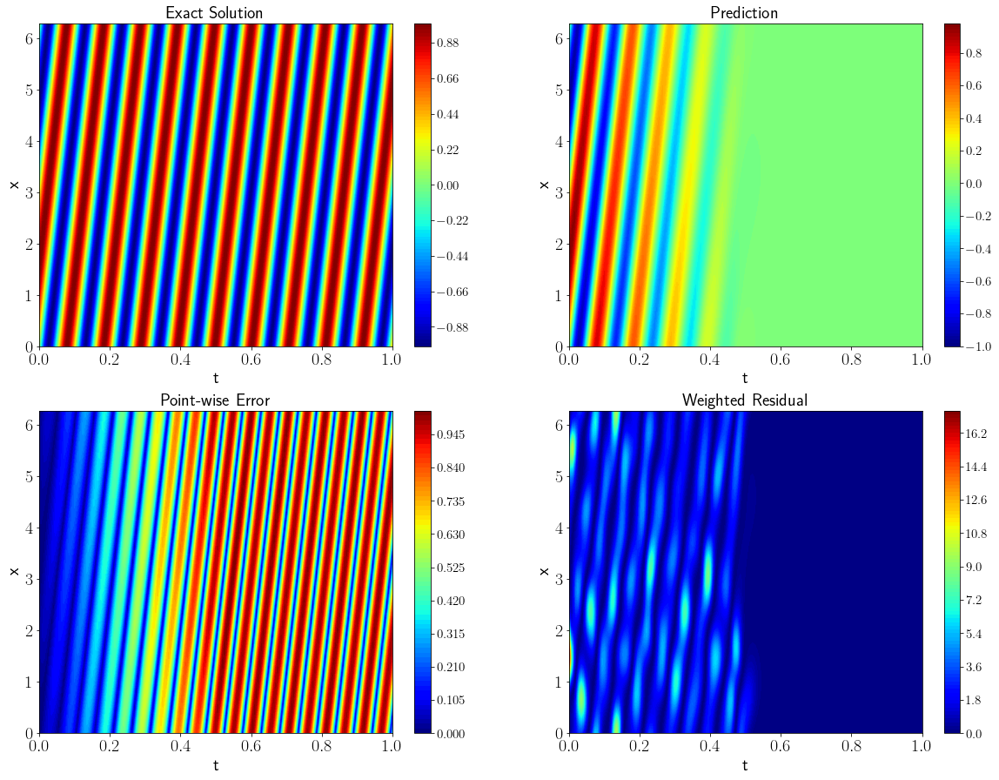

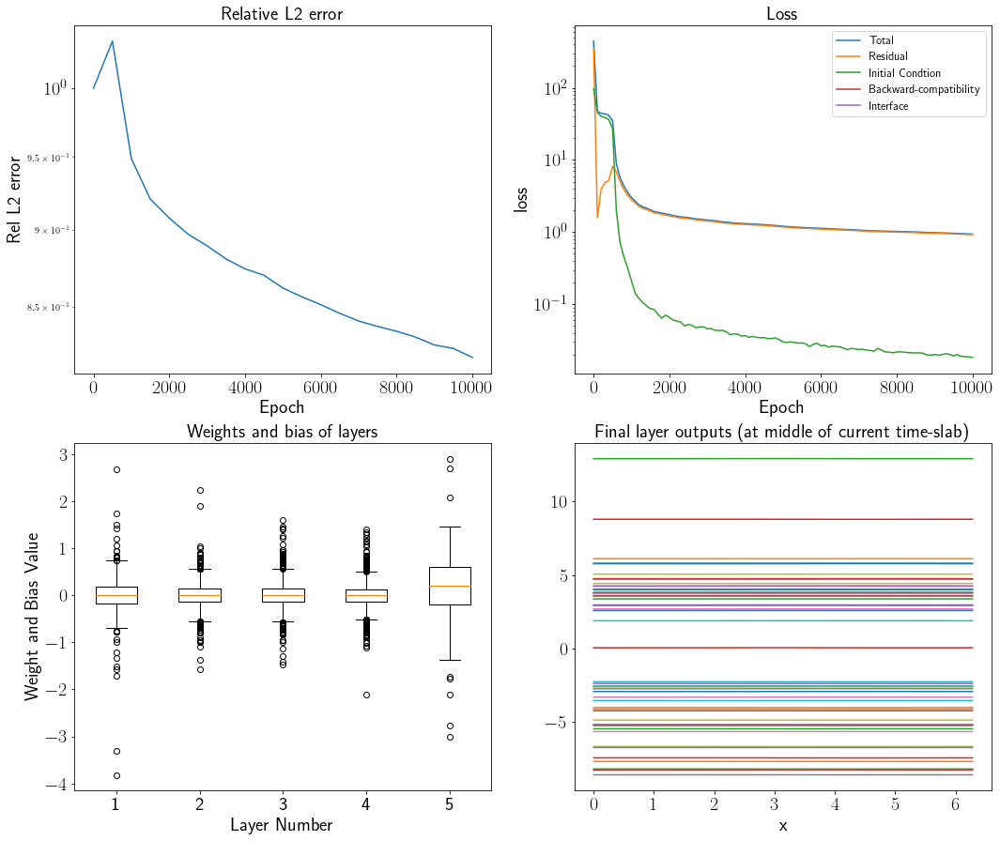

L2-error:  0.8184982952090378
Train L-BFGS:
epoch 100, loss: 0.938348, delta loss: 2.03848e-05
epoch 200, loss: 0.935464, delta loss: 3.8445e-05
epoch 300, loss: 0.93298, delta loss: 2.68221e-05
epoch 400, loss: 0.930894, delta loss: 1.84178e-05
epoch 500, loss: 0.928188, delta loss: 2.18153e-05
Training time: 721.5663


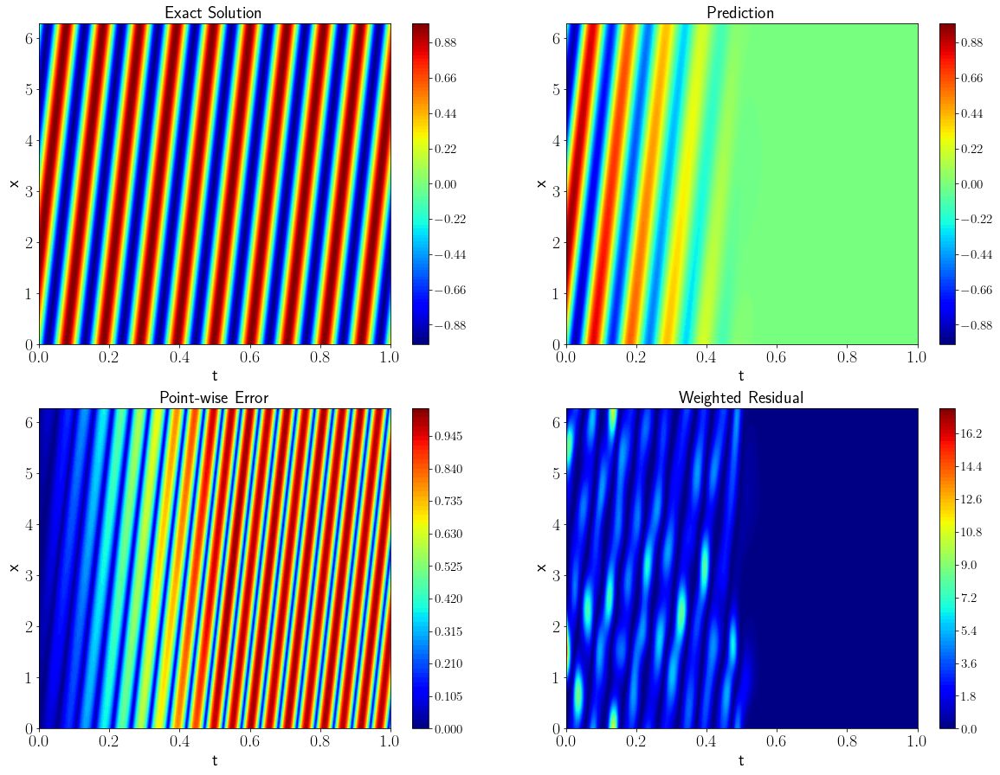

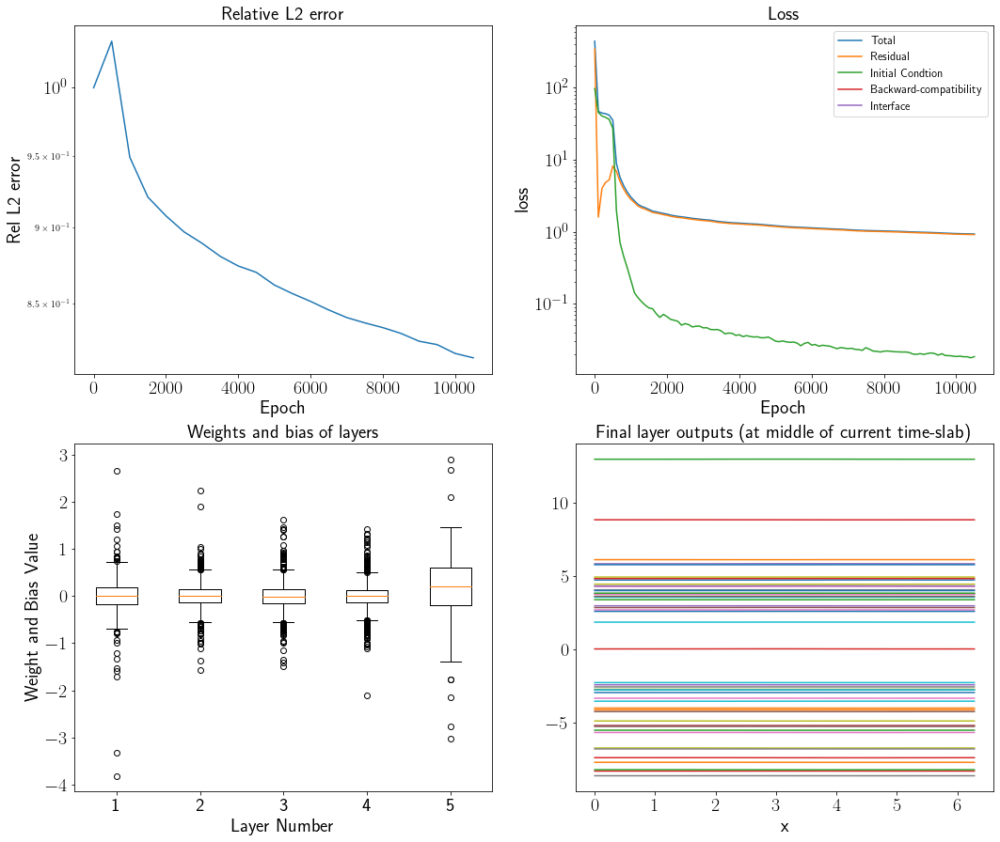

L2-error:  0.8158045790054651
Train L-BFGS:
epoch 100, loss: 0.92455, delta loss: 5.78165e-05
epoch 200, loss: 0.920443, delta loss: 5.48959e-05
epoch 300, loss: 0.916398, delta loss: 3.25441e-05
epoch 400, loss: 0.91272, delta loss: 2.77162e-05
epoch 500, loss: 0.910922, delta loss: 2.3663e-05
Training time: 755.1506


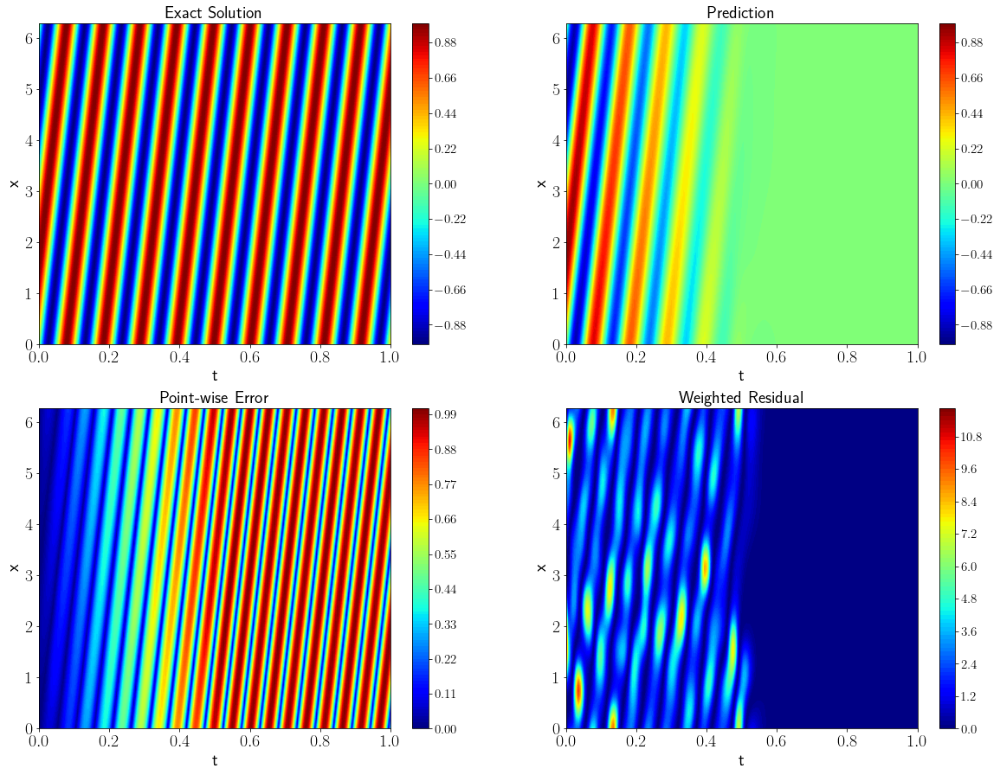

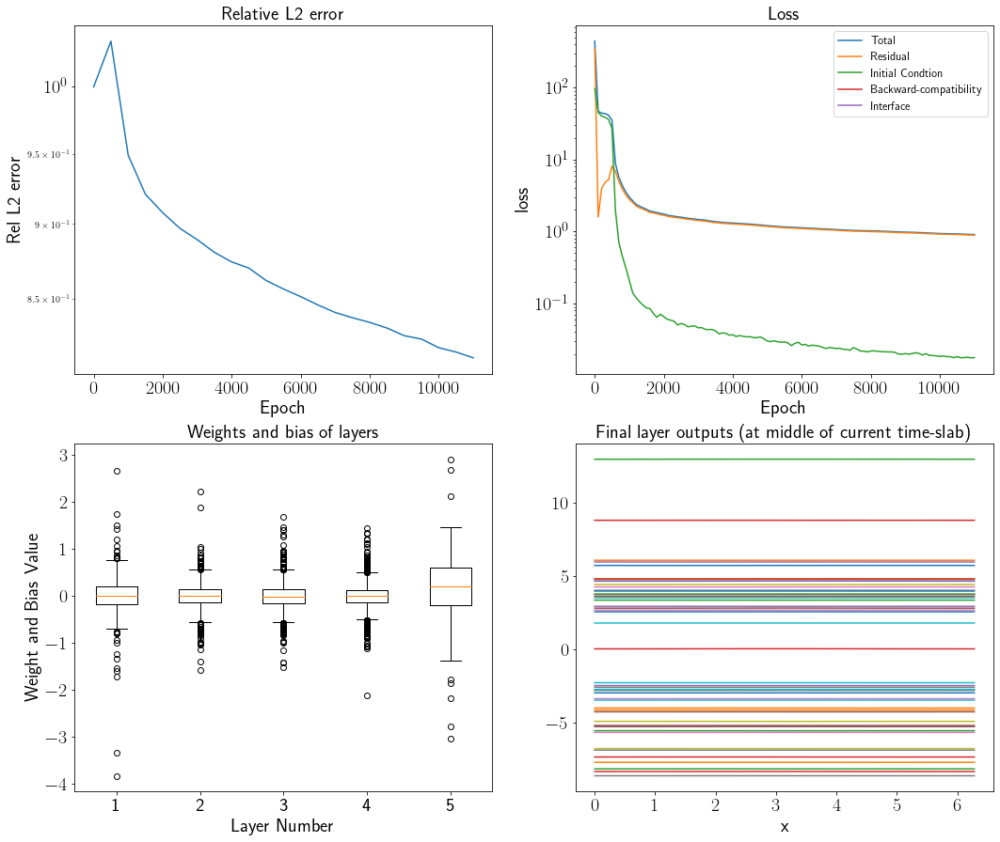

L2-error:  0.8121784803437432
Train L-BFGS:
epoch 100, loss: 0.909134, delta loss: 1.49608e-05
epoch 200, loss: 0.907116, delta loss: 2.24113e-05
epoch 300, loss: 0.905637, delta loss: 1.29938e-05
epoch 400, loss: 0.904531, delta loss: 8.82149e-06
epoch 500, loss: 0.903502, delta loss: 7.98702e-06
Training time: 789.3109


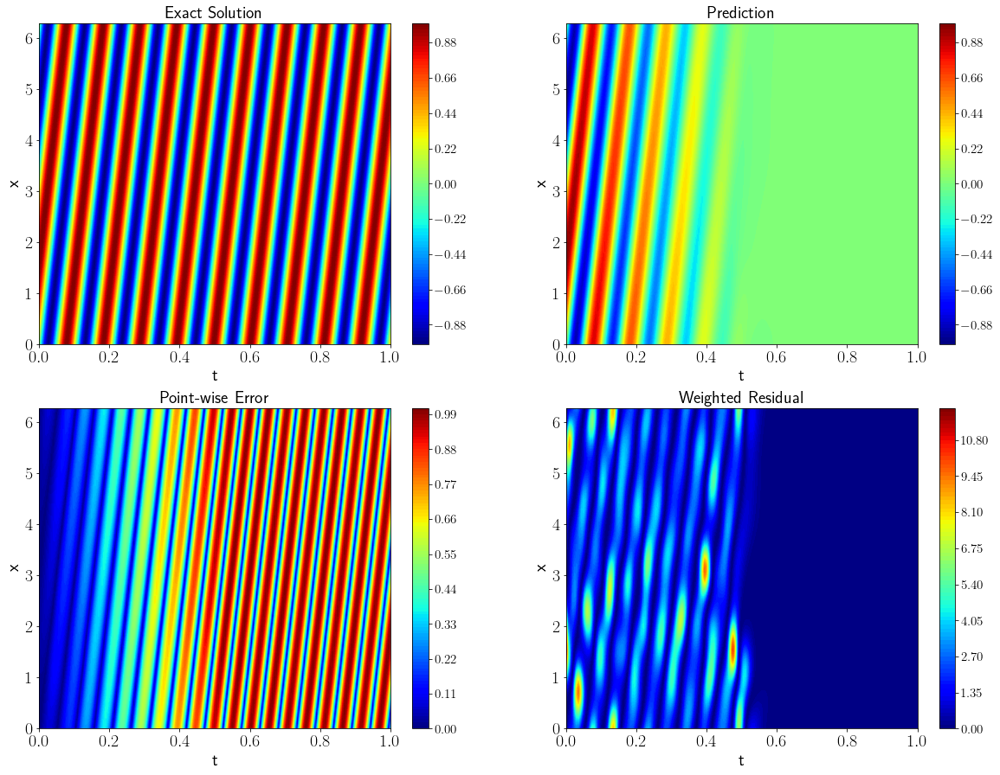

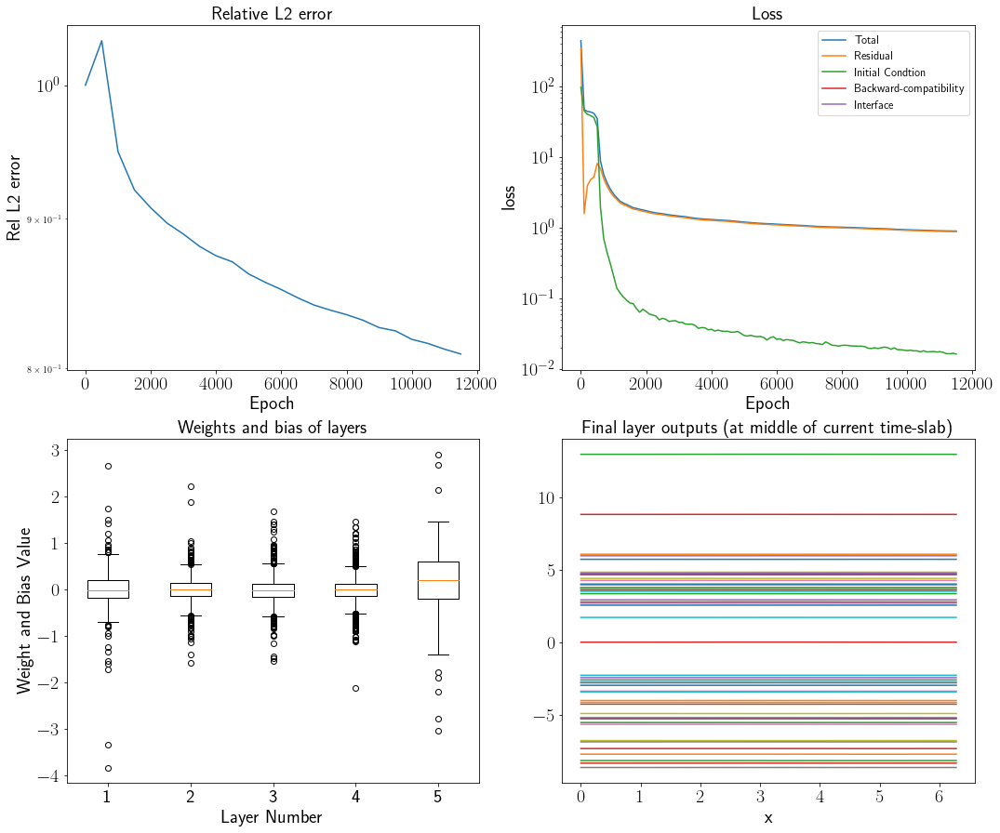

L2-error:  0.8090910496276551
Train L-BFGS:
epoch 100, loss: 0.902648, delta loss: 1.09076e-05
epoch 200, loss: 0.901837, delta loss: 4.82798e-06


KeyboardInterrupt: 

In [10]:
adam_loops = 1
lbfgs_loops = 300
model = training_loop(userPar, dataPar, model, adam_loops, lbfgs_loops)